<a href="https://colab.research.google.com/github/d-vf/LSSP-crypto-communities/blob/main/cypherpunks/Cypherpunks_LDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install gensim wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive') 

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#output
import os
os.chdir('/content/drive/MyDrive/Coursework/88-718/Data')

In [ ]:
import pandas as pd
allmails_data_time_parsed_utc =pd.read_csv('/content/drive/MyDrive/Coursework/88-718/Data/allmails_data_time_parsed_utc.csv')
#allmails_data_time_parsed_utc = allmails_data_time_parsed_utc.iloc[0:10000]
allmails_data_time_parsed_utc

<ipython-input-41-48cde8642586>:2: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  allmails_data_time_parsed_utc =pd.read_csv('/content/drive/MyDrive/Coursework/88-718/Data/allmails_data_time_parsed_utc.csv')


,From,To,Message-ID,Date,Subject,In-Reply-To,MIME-Version,Content-Type,Body,parsed_dates,parsed_dates_uct
0,cornpop@glia.biostr.washington.edu (Dan Lieber...,cypherpunks@toad.com,<9401010953.AA09462@glia.biostr.washington.edu>,"Sat, 1 Jan 94 01:48:39 PST",All of this Death Threat Shit.,NaN,1.0,text/plain,\nHello Fellow CypherPunks....\n\nI've never p...,1994-01-01 01:48:39-08:00,1994-01-01 09:48:39+00:00
1,ferguson@icm1.icp.net (Paul Ferguson),cornpop@glia.biostr.washington.edu (Dan Lieber...,<9401011651.AA22931@icm1.icp.net>,"Sat, 1 Jan 94 08:54:22 PST",Re: All of this Death Threat Shit.,<9401010953.AA09462@glia.biostr.washington.edu>,1.0,text,\n\nDan Lieberman wrote - \n \n> That's how it...,1994-01-01 08:54:22-08:00,1994-01-01 16:54:22+00:00
2,"""Perry E. Metzger"" <pmetzger@lehman.com>",Jim_Miller@bilbo.suite.com,<199401011716.MAA28882@snark>,"Sat, 1 Jan 94 09:19:02 PST",Re: Anonymous Video on Demand,<9312312259.AA25911@bilbo.suite.com>,1.0,text/plain,\n\nJim Miller says:\n> The Customer and the V...,1994-01-01 09:19:02-08:00,1994-01-01 17:19:02+00:00
3,"""Perry E. Metzger"" <pmetzger@lehman.com>",Jim_Miller@bilbo.suite.com,<199401011723.MAA28889@snark>,"Sat, 1 Jan 94 09:28:49 PST",Re: Anonymous Video on Demand,<9401010055.AA27523@bilbo.suite.com>,1.0,text/plain,\n\nJim Miller says:\n> As I think about it mo...,1994-01-01 09:28:49-08:00,1994-01-01 17:28:49+00:00
4,Matt Blaze <mab@crypto.com>,cypherpunks@toad.com,<9401011821.AA24360@crypto.com>,"Sat, 1 Jan 94 10:38:53 PST",Re: Anonymous Video on Demand,<9401010055.AA27523@bilbo.suite.com>,1.0,text/plain,\nIn cypherpunks you write:\n...\n>(The follow...,1994-01-01 10:38:53-08:00,1994-01-01 18:38:53+00:00
...,...,...,...,...,...,...,...,...,...,...,...
251794,grarpamp <grarpamp@gmail.com>,cypherpunks@cpunks.org,<CAD2Ti2-W_H88jHDW6iGqczkmFAJS5JbG7GS4J_ywwOkL...,"Sun, 12 Mar 2023 22:00:36 -0400","Re: US 2nd Amendment Under Assault, Freedom Fi...",<CAD2Ti2-X0EqO5qgpyh6fJYpEei+BsYHFTDiKPmN22+pT...,1.0,"text/plain; charset=""UTF-8""",Constitutional carry *is* open carry.\nConstit...,2023-03-12 22:00:36-04:00,2023-03-13 02:00:36+00:00
251795,grarpamp <grarpamp@gmail.com>,cypherpunks@cpunks.org,<CAD2Ti2_7m_EKjKYs6C7+MtK1Z=Z0oh51KKT3XDaVYttU...,"Sun, 12 Mar 2023 22:02:33 -0400",Re: War re Ukraine: Thread,<CAD2Ti2-6p0vfKqc+adfadjUttVUx9uh621JRhbs3S9xq...,1.0,"text/plain; charset=""UTF-8""",Jon Stewart Skewers Military-Industrial Comple...,2023-03-12 22:02:33-04:00,2023-03-13 02:02:33+00:00
251796,grarpamp <grarpamp@gmail.com>,cypherpunks@cpunks.org,<CAD2Ti28iE_+z9CdWEXDbyE3KdpBPFCu-CAWSDMj4u5q3...,"Sun, 12 Mar 2023 22:07:04 -0400",Re: USA 2024 Elections Thread,<CAD2Ti28jWGWX5YV5zXrJTQCu9v3YtLsCksKGUGMxAXRr...,1.0,"text/plain; charset=""UTF-8""",Democrats have wrecked their own Big American ...,2023-03-12 22:07:04-04:00,2023-03-13 02:07:04+00:00
251797,grarpamp <grarpamp@gmail.com>,cypherpunks@cpunks.org,<CAD2Ti2_nKuz+PeeAuEvGoHdHE+4uke5REwyNY3Yc8L_+...,"Sun, 12 Mar 2023 22:22:48 -0400",Re: Cryptocurrency: BANK RUN PANIC Spreads Aro...,<CAD2Ti2-3bFZi5GWK8ATA8zakvv+sZQ+cWSw-Lz6OwSUQ...,1.0,"text/plain; charset=""UTF-8""",A fifth bank collapses...\n\n11 hours remain u...,2023-03-12 22:22:48-04:00,2023-03-13 02:22:48+00:00


In [ ]:
allmails_data_time_parsed_utc['Subject'] = allmails_data_time_parsed_utc['Subject'].astype(str)
type(allmails_data_time_parsed_utc['Subject'][0])

str

LDA

In [ ]:
import gensim 
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models.coherencemodel import CoherenceModel
from gensim import similarities
import os.path
import re
import glob
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from collections import Counter
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
import re
import gensim
import nltk
from collections import Counter
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

import re

def preprocess_text(text):
    # Convert to string if not already a string
    if not isinstance(text, str):
        text = str(text)
    
    # Remove URLs
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'www\S+', '', text)
    # Remove newline characters
    text = text.replace('\n', ' ')
    
    # Remove email addresses
    text = re.sub(r'\S+@\S+', '', text)
    
    # Remove HTML tags
    text = re.sub("<.*?>", "", text)
    
    # Remove non-alphanumeric characters
    text = re.sub(r'\W', ' ', text)
    
    # Remove extra whitespace
    text = re.sub(r'\s+', ' ', text)
    
    # Convert to lowercase
    text = text.lower()
    
    # Remove stopwords and return the cleaned text
    return text


def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN
    
def lemmatize_text(text):
    lemmatizer = WordNetLemmatizer()
    tokenized_text = word_tokenize(text)
    tagged_tokens = nltk.pos_tag(tokenized_text)
    
    lemmatized_tokens = [lemmatizer.lemmatize(token, pos=get_wordnet_pos(tag)) for token, tag in tagged_tokens]
    lemmatized_text = " ".join(lemmatized_tokens)
    
    return lemmatized_text

def tokenize_text(text):
    return text.split()

def sent_to_words(sentences):
    for sentence in sentences:
        # deacc=True removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) 
             if word not in stop_words] for doc in texts]

allmails_data_time_parsed_utc['Cleaned_Body'] = allmails_data_time_parsed_utc['Body'].apply(preprocess_text)

allmails_data_time_parsed_utc['Lemmatized_Body'] = allmails_data_time_parsed_utc['Cleaned_Body'].apply(lemmatize_text)

allmails_data_time_parsed_utc['Tokenized_Lemmatized_Body'] = allmails_data_time_parsed_utc['Lemmatized_Body'].apply(tokenize_text)

data = allmails_data_time_parsed_utc['Tokenized_Lemmatized_Body'].values.tolist()

words = [word for sublist in allmails_data_time_parsed_utc['Tokenized_Lemmatized_Body'] for word in sublist]
word_freq = Counter(words)
most_common_words = [word for word, freq in word_freq.most_common(100)]

allmails_data_time_parsed_utc['Cleaned_Body_No_Stopwords'] = allmails_data_time_parsed_utc['Cleaned_Body'].apply(lambda x: ' '.join([word for word in x.split() if word not in most_common_words]))

data = allmails_data_time_parsed_utc['Cleaned_Body_No_Stopwords'].values.tolist()
data_words = list(sent_to_words(data))

stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])
stop_words.extend(['would', 'key', 'message', 'mail', 'list','get','will', 'know','think','also,','could','messages','may','knew',
                   'one','like', 'pm', 'td', 'tr', 'width', 'size', 'br', 'div', 'href', 'eb', 'begin','color','font'])

data_words = remove_stopwords(data_words)

## 43 mn

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
most_common_words

['the',
 'be',
 'to',
 'a',
 'of',
 'and',
 'in',
 'that',
 'it',
 'i',
 'for',
 'have',
 'you',
 'on',
 's',
 'this',
 'not',
 'with',
 'or',
 't',
 'do',
 'at',
 'by',
 'from',
 'if',
 'they',
 'can',
 'but',
 'an',
 'we',
 'will',
 'your',
 'use',
 'all',
 'would',
 'one',
 'what',
 'write',
 'there',
 'so',
 'about',
 'their',
 'say',
 'get',
 'which',
 'more',
 '80',
 'make',
 'no',
 'who',
 'e2',
 'people',
 'he',
 'my',
 'u',
 'some',
 '1',
 'like',
 'any',
 'out',
 'just',
 'key',
 'time',
 'other',
 '2',
 'message',
 'know',
 'may',
 'them',
 'up',
 'only',
 'pgp',
 'go',
 'don',
 'government',
 'when',
 'list',
 'system',
 'me',
 'than',
 'how',
 'think',
 'his',
 'could',
 'work',
 'information',
 'even',
 'also',
 'e',
 'see',
 'mail',
 'new',
 'now',
 'good',
 'our',
 'then',
 'state',
 'take',
 'way',
 'right']

In [ ]:
import gensim.corpora as corpora
# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:1][0][:30])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 3), (15, 1), (16, 2), (17, 1), (18, 2), (19, 2), (20, 1), (21, 1), (22, 1), (23, 1), (24, 2), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1)]


## LDA

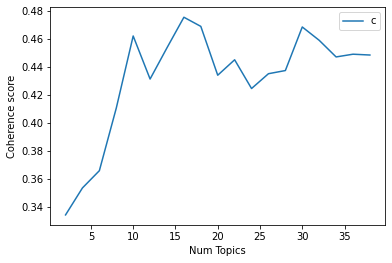

Num Topics = 2  has Coherence Value of 0.3344
Num Topics = 4  has Coherence Value of 0.3536
Num Topics = 6  has Coherence Value of 0.366
Num Topics = 8  has Coherence Value of 0.4107
Num Topics = 10  has Coherence Value of 0.4623
Num Topics = 12  has Coherence Value of 0.4315
Num Topics = 14  has Coherence Value of 0.4538
Num Topics = 16  has Coherence Value of 0.4757
Num Topics = 18  has Coherence Value of 0.4691
Num Topics = 20  has Coherence Value of 0.4342
Num Topics = 22  has Coherence Value of 0.4452
Num Topics = 24  has Coherence Value of 0.4247
Num Topics = 26  has Coherence Value of 0.4353
Num Topics = 28  has Coherence Value of 0.4375
Num Topics = 30  has Coherence Value of 0.4687
Num Topics = 32  has Coherence Value of 0.4592
Num Topics = 34  has Coherence Value of 0.4473
Num Topics = 36  has Coherence Value of 0.4492
Num Topics = 38  has Coherence Value of 0.4486


In [ ]:
from gensim.models.coherencemodel import CoherenceModel

def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=2):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.LdaMulticore(corpus=corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

# Can take a long time to run (60m) 133
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words, start=2, limit=40, step=2)

# Show graph
import matplotlib.pyplot as plt
limit=40; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))


In [ ]:
from pprint import pprint
# number of topics
num_topics = 16
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                      id2word=id2word,
                                       num_topics=num_topics)


# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

In [ ]:
! pip install wordcloud 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


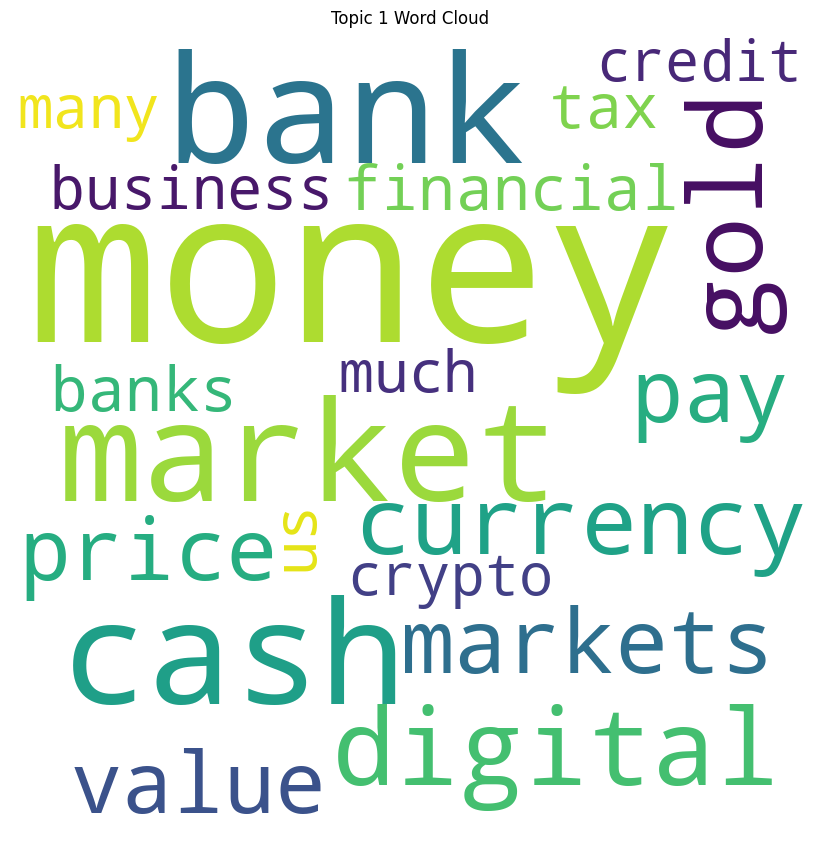

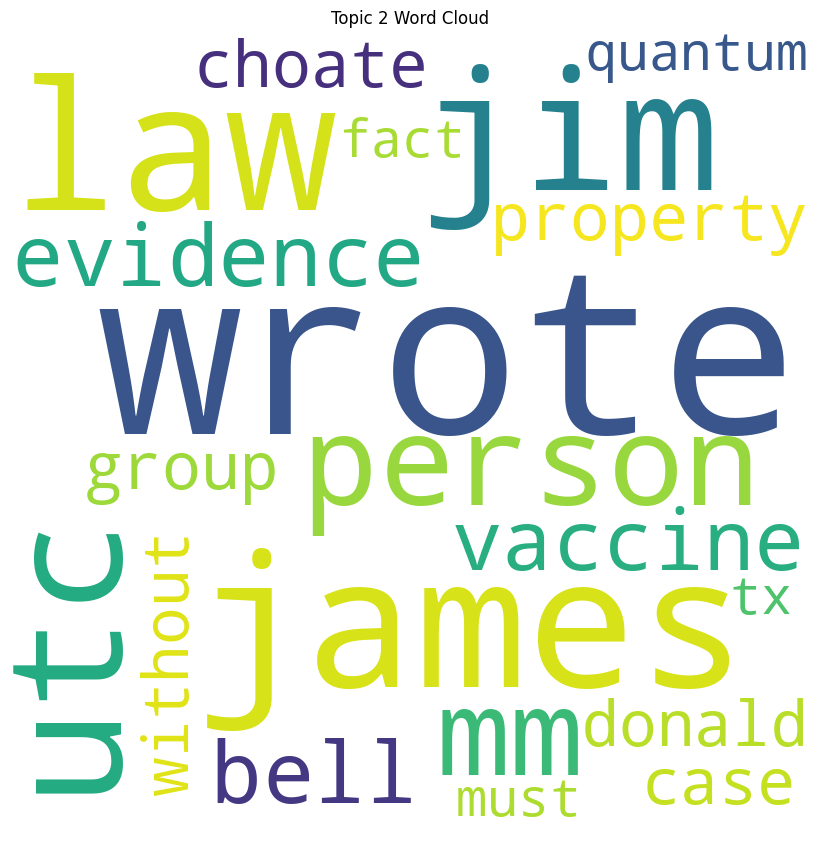

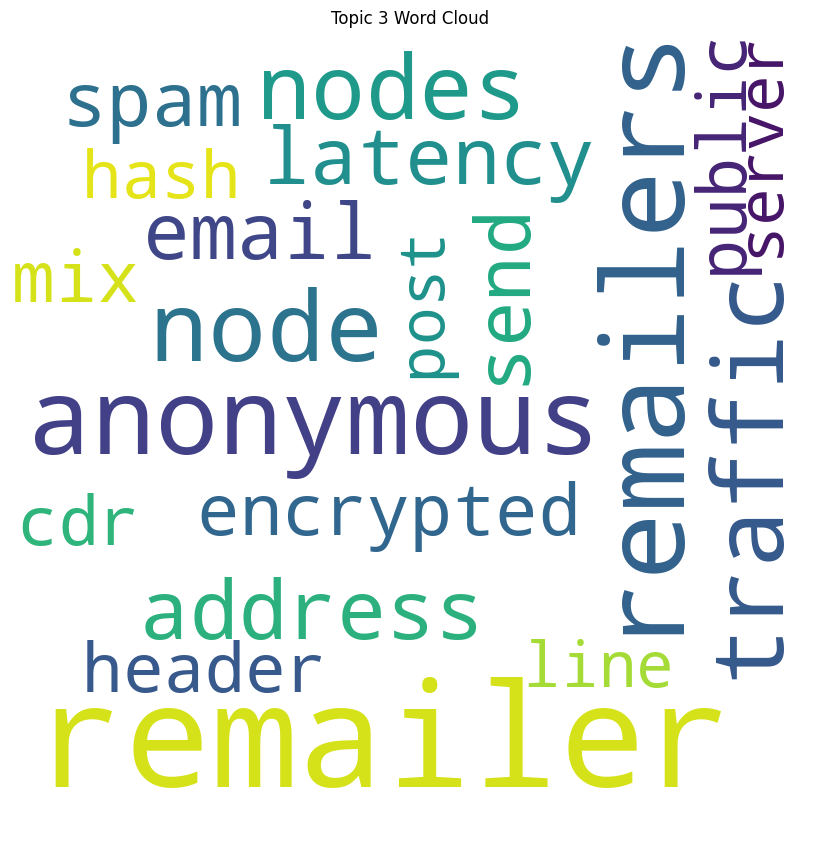

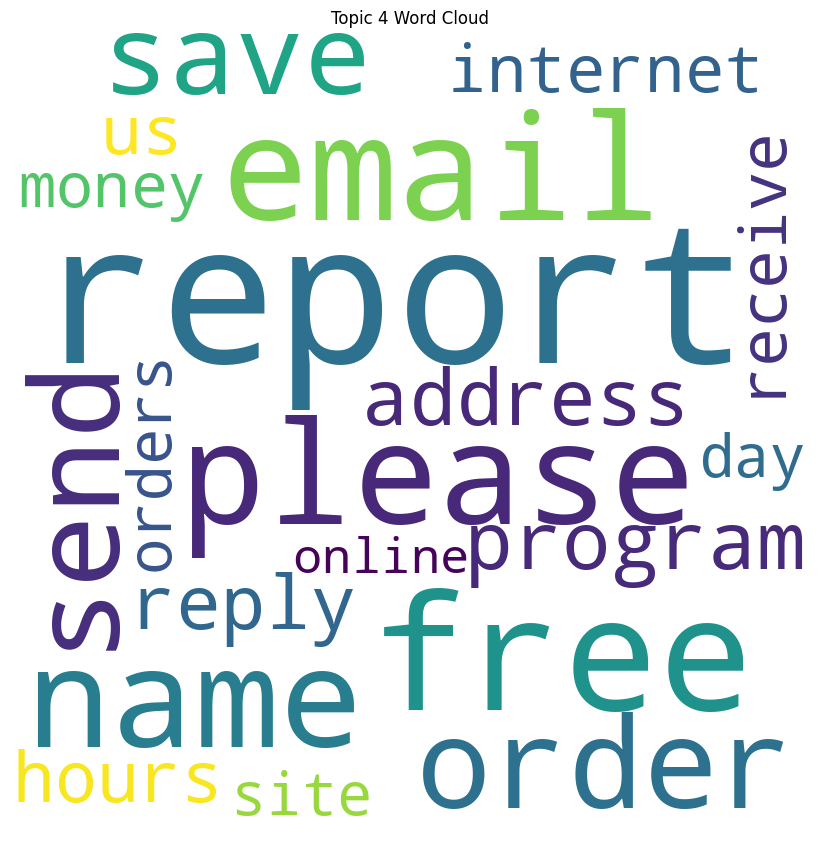

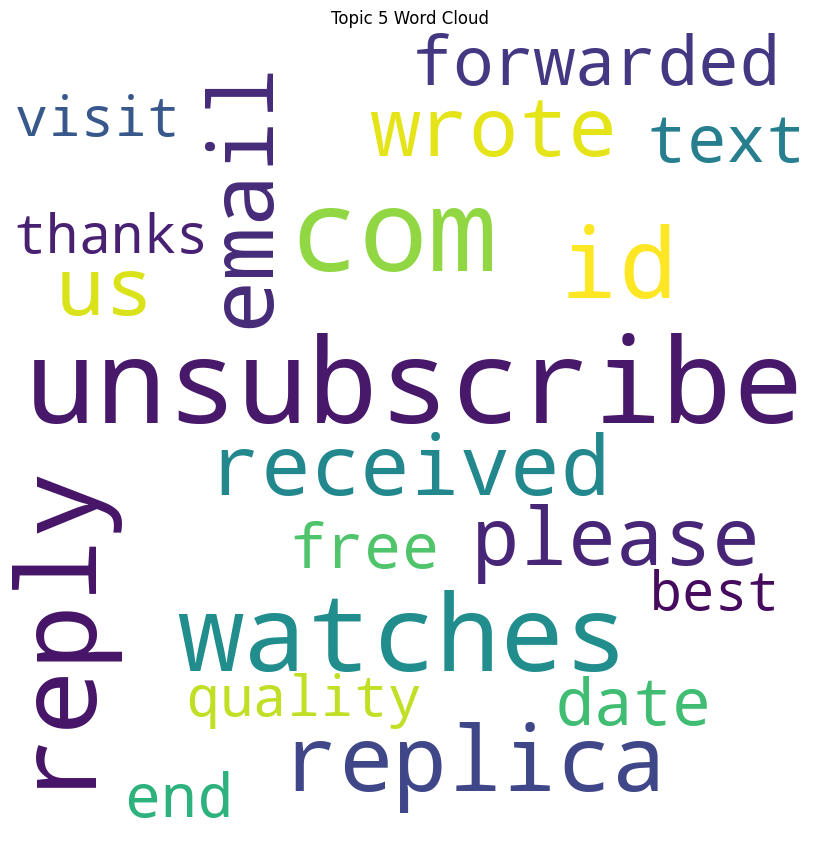

...

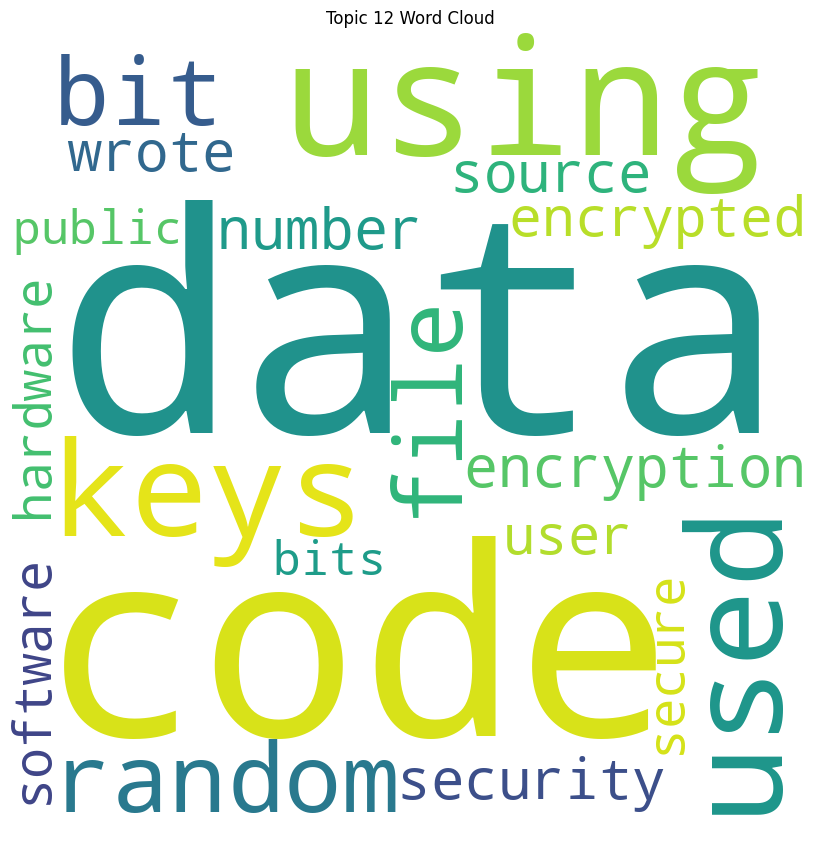

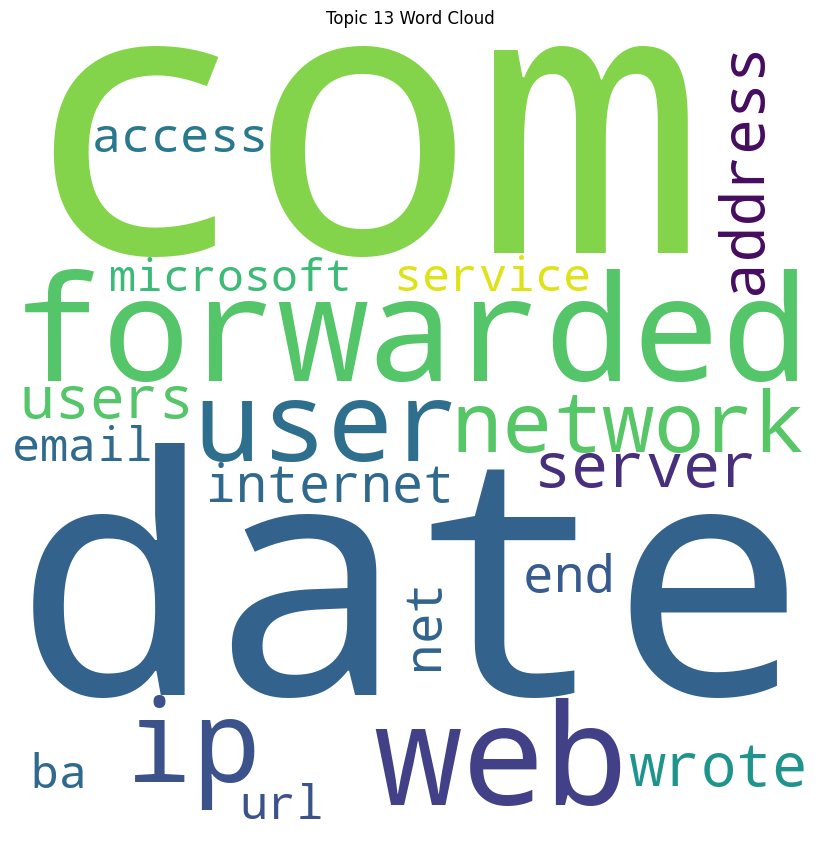

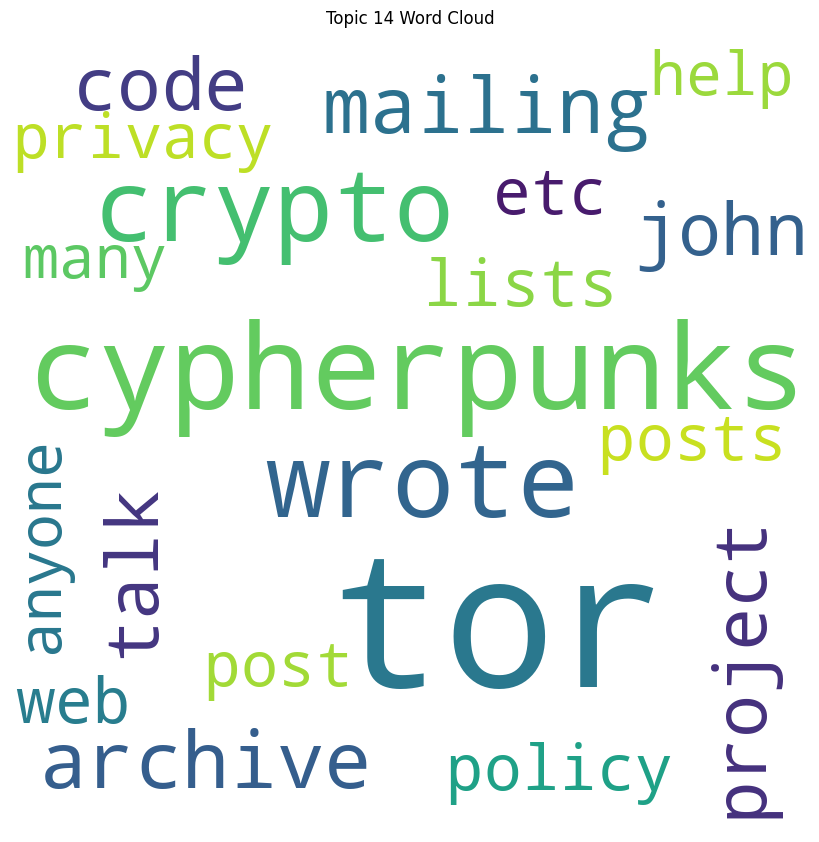

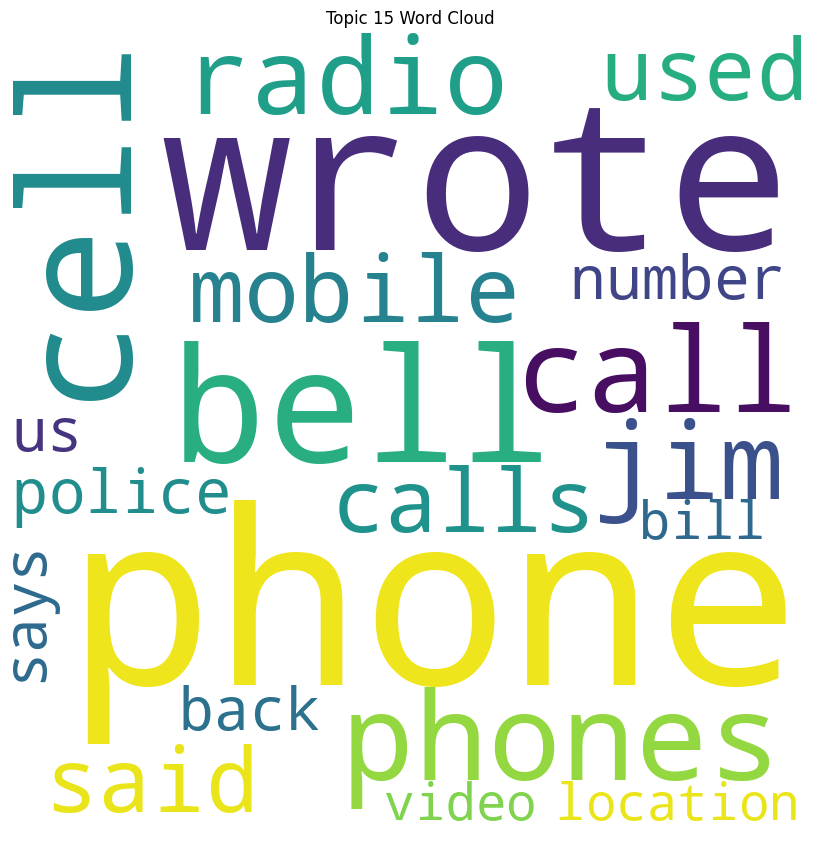

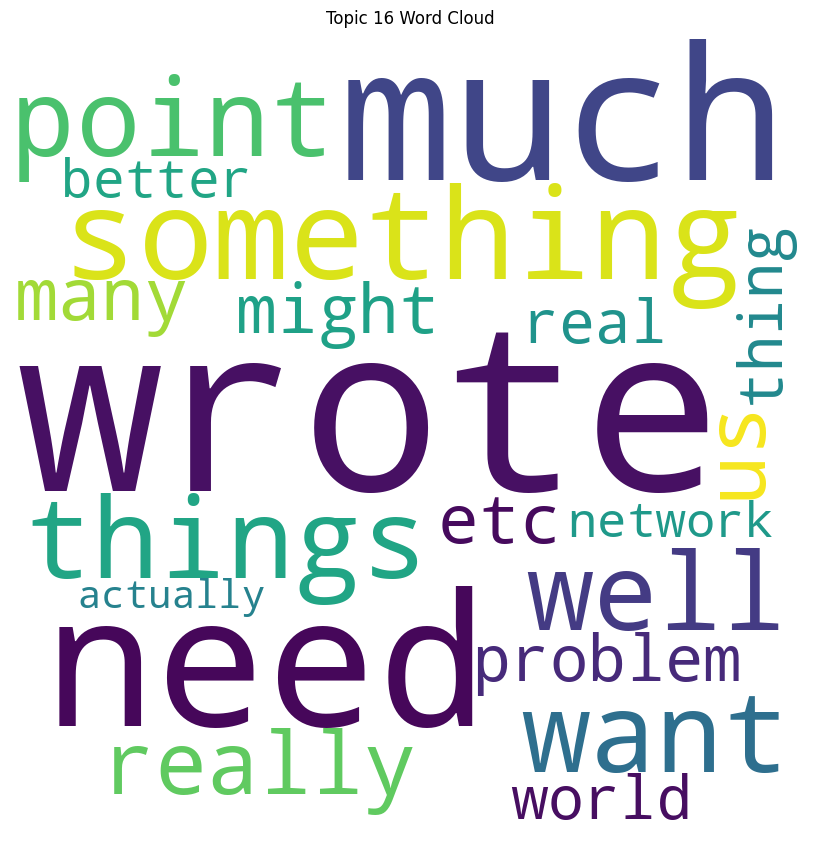

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Create word clouds for each topic
for i in range(num_topics):
    # Extract top words for topic
    top_words = dict(lda_model.show_topic(i, topn=20))
    
    # Create word cloud
    wordcloud = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(top_words)
    
    # Plot word cloud
    plt.figure(figsize=(8,8), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.title(f'Topic {i+1} Word Cloud')
    plt.show()

In [ ]:
def show_topics(model, num_topics, num_words):
    topics = model.show_topics(num_topics=num_topics, num_words=num_words, formatted=False)
    for topic_id, topic in enumerate(topics):
        print(f"Topic {topic_id}:")
        words = [word for word, _ in topic[1]]
        print(" ".join(words))
        print()

num_topics_to_show = 16
num_words_per_topic = 10

show_topics(lda_model, num_topics_to_show, num_words_per_topic)

Topic 0:
money bank cash market digital gold currency markets pay price

Topic 1:
wrote james law jim utc person mm evidence bell vaccine

Topic 2:
remailer remailers anonymous traffic node nodes address latency email send

Topic 3:
report free email please name order send save program address

Topic 4:
unsubscribe com reply watches id replica email received wrote us

Topic 5:
us said world war trump many political years media first

Topic 6:
vpn bin linux yap mit signature pdb der version echo

Topic 7:
wrote shit juan declan fucking punk fuck oh sun well

Topic 8:
ia signature ii end signed io version ai sha ea

Topic 9:
wrote crypto law us laws speech tim free child children

Topic 10:
security said data internet law privacy technology public company national

Topic 11:
data code using keys used random bit file encryption number

Topic 12:
com date forwarded web ip user network server address wrote

Topic 13:
tor cypherpunks wrote crypto archive mailing code talk project john

Topic

In [ ]:
def get_topic_distribution_for_docs(lda_model, corpus):
    topic_distributions = []
    for doc_id, doc in enumerate(corpus):
        doc_topics = lda_model.get_document_topics(doc)
        topic_distributions.append(doc_topics)
    return topic_distributions
    
topic_distributions = get_topic_distribution_for_docs(lda_model, corpus)

In [ ]:
len(topic_distributions)

251799

In [ ]:
topic_distributions

[[(5, 0.29863986), (7, 0.23907585), (13, 0.15649009), (15, 0.29819357)],
 [(5, 0.29455134), (7, 0.48619002), (12, 0.06325635), (14, 0.121729895)],
 [(3, 0.1385079), (11, 0.39554974), (14, 0.29857916), (15, 0.14524801)],
 [(1, 0.3999581), (11, 0.5698232)],
 [(4, 0.16351624), (11, 0.83111036)],
 [(5, 0.098392636),
  (8, 0.057286344),
  (10, 0.3597775),
  (12, 0.12885019),
  (13, 0.35021952)],
 [(0, 0.012525178),
  (1, 0.012525179),
  (2, 0.012525178),
  (3, 0.012525179),
  (4, 0.81212234),
  (5, 0.012525185),
  (6, 0.012525175),
  (7, 0.012525187),
  (8, 0.012525175),
  (9, 0.012525187),
  (10, 0.012525178),
  (11, 0.012525182),
  (12, 0.012525178),
  (13, 0.012525182),
  (14, 0.012525198),
  (15, 0.012525178)],
 [(0, 0.03125848),
  (1, 0.031258494),
  (2, 0.03125849),
  (3, 0.031258482),
  (4, 0.031258486),
  (5, 0.031258482),
  (6, 0.031258494),
  (7, 0.03125848),
  (8, 0.031258482),
  (9, 0.03125848),
  (10, 0.031258497),
  (11, 0.5311227),
  (12, 0.031258497),
  (13, 0.031258482),
  

## jensen shannon divergence

* Network graph based on the Jensen-Shannon divergence between the topic-word distributions
* hows the relationships between topics based on their similarity in terms of word usage. 
* The thicker and darker edges between nodes indicate a stronger relationship, while the node size represents the relative importance of each topic.

In [ ]:
import numpy as np
from scipy.spatial.distance import jensenshannon

def jensen_shannon_divergence(topic_a, topic_b):
    return jensenshannon(topic_a, topic_b)

topic_word_distr = lda_model.get_topics()
num_topics = topic_word_distr.shape[0]

topic_topic_distr = np.zeros((num_topics, num_topics))

for i in range(num_topics):
    for j in range(i + 1, num_topics):
        js_divergence = jensen_shannon_divergence(topic_word_distr[i], topic_word_distr[j])
        topic_topic_distr[i, j] = js_divergence
        topic_topic_distr[j, i] = js_divergence

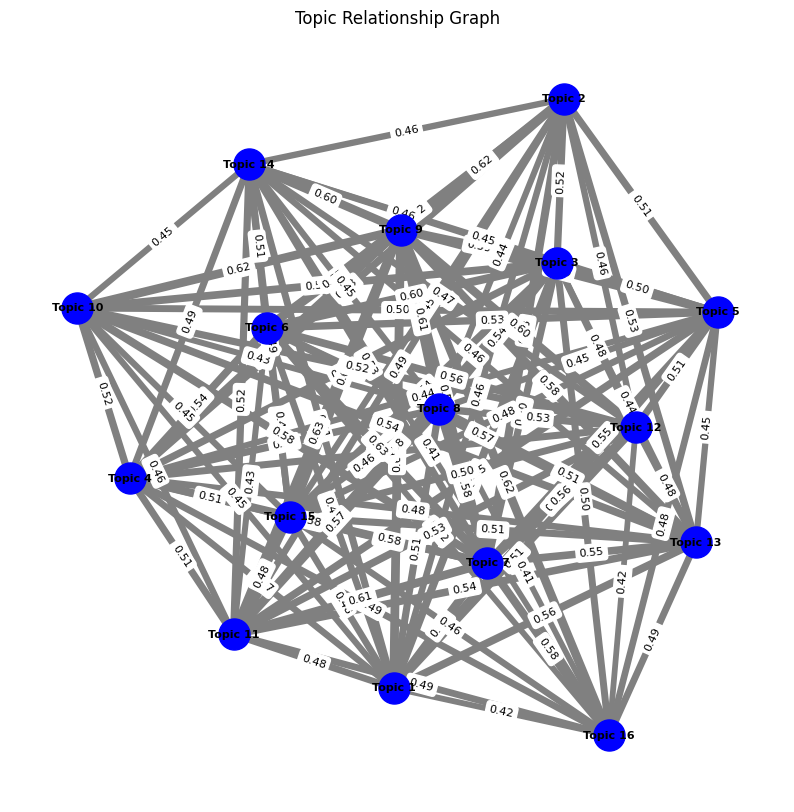

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Create graph
G = nx.Graph()

# Add nodes for each topic
for i in range(num_topics):
    G.add_node(f'Topic {i+1}')

# Add edges with weights based on probability of one topic being related to another
for i in range(num_topics):
    for j in range(i+1,num_topics):
        weight = topic_topic_distr[i,j]
        if weight > 0.4:
            G.add_edge(f'Topic {i+1}', f'Topic {j+1}', weight=weight)

# Set the layout, adjust node and edge colors, and shapes
pos = nx.spring_layout(G)
node_color = 'blue'
node_shape = 'o'
edge_color = 'grey'
#node_border_color = 'k'

# Create figure and axis
fig, ax = plt.subplots(figsize=(10,10))

# Remove white background
ax.set_facecolor('white')

# Draw graph
nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold', ax=ax)
nx.draw_networkx_edges(G, pos, width=[d['weight']*10 for (u,v,d) in G.edges(data=True)], edge_color=edge_color, ax=ax)
nx.draw_networkx_edge_labels(G, pos, edge_labels={(u,v):"{:.2f}".format(d['weight']) for (u,v,d) in G.edges(data=True)}, font_size=8, ax=ax)
nx.draw_networkx_nodes(G, pos, node_size=500, node_shape=node_shape, node_color=node_color, linewidths=1, ax=ax)

plt.axis('off')
plt.title("Topic Relationship Graph")
plt.show()


## Linkage

In [ ]:
# Convert 'Date_utc' to datetime objects, if it isn't already
allmails_data_time_parsed_utc['Date_utc'] = pd.to_datetime(allmails_data_time_parsed_utc['parsed_dates_uct'])

# Create a new column called 'interval' containing the interval information as years
allmails_data_time_parsed_utc['interval'] = allmails_data_time_parsed_utc['Date_utc'].dt.to_period('Y')

<ipython-input-26-02ebf61cf4ea>:5: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  allmails_data_time_parsed_utc['interval'] = allmails_data_time_parsed_utc['Date_utc'].dt.to_period('Y')


In [ ]:
# Group the dataset by the 'interval' column and extract the text column for each group
grouped_docs = allmails_data_time_parsed_utc.groupby('interval')['Cleaned_Body_No_Stopwords'].apply(list)

# Convert the grouped data to a dictionary
timeframes = grouped_docs.to_dict()

In [ ]:
timeframe_corpora = {}
for timeframe, docs in timeframes.items():
    dictionary = lda_model.id2word  # Use the dictionary from your existing LDA model
    corpus_0 = [dictionary.doc2bow(doc.split()) for doc in docs]
    timeframe_corpora[timeframe] =  corpus_0
    
def draw_linkage_network(lda_model, corpus, num_topics, title):
    G = nx.Graph()
    for i in range(num_topics):
        G.add_node(i)

    topic_cooccurrence = {(i, j): 0 for i in range(num_topics) for j in range(num_topics) if i != j}
    for doc in lda_model.get_document_topics(corpus, minimum_probability=0.1):
        for t1 in doc:
            for t2 in doc:
                if t1[0] != t2[0]:
                    topic_cooccurrence[(t1[0], t2[0])] += 1

    for pair, count in topic_cooccurrence.items():
        G.add_edge(pair[0], pair[1], weight=count)

    pos = nx.spring_layout(G)
    plt.figure(figsize=(8, 8))
    nx.draw_networkx_nodes(G, pos, node_size=500, node_color="skyblue")
    edges = G.edges(data=True)
    edge_colors = [edge[2]["weight"] for edge in edges]
    edge_widths = [edge[2]["weight"] / max(edge_colors) * 5 for edge in edges]  # Scale edge widths
    nx.draw_networkx_edges(G, pos, edgelist=edges, edge_color=edge_colors, edge_cmap=plt.cm.Blues, width=edge_widths)
    node_labels = {i: f"Topic {i}" for i in range(num_topics)}
    nx.draw_networkx_labels(G, pos, labels=node_labels)
    plt.title(title)
    plt.axis("off")
    plt.show()

In [ ]:
! pip install python-louvain

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


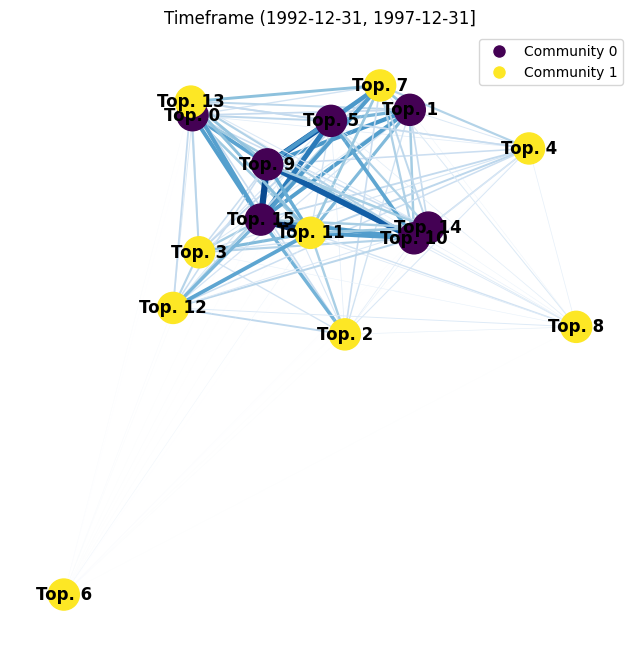

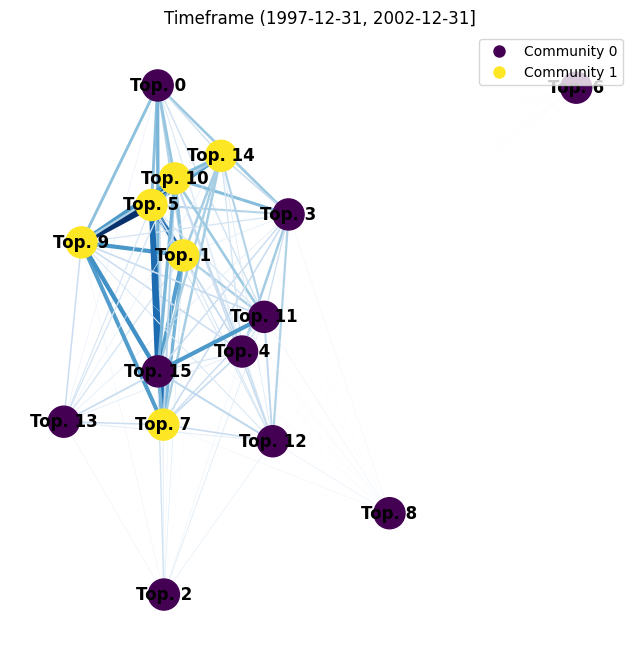

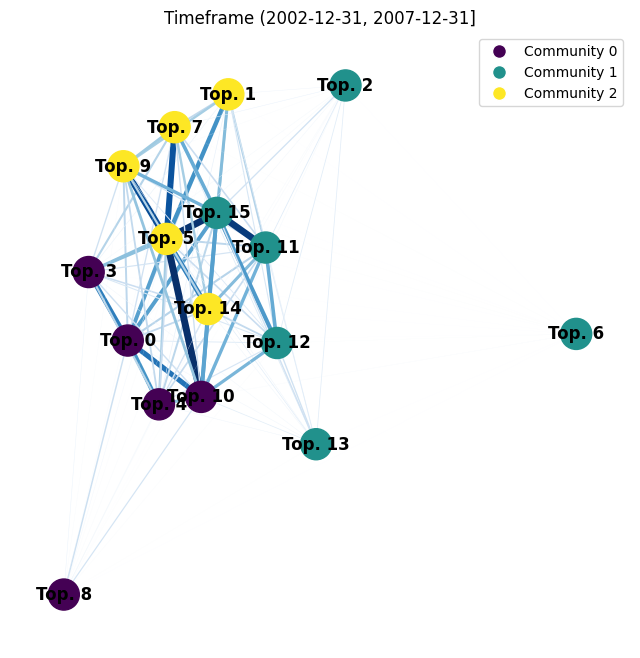

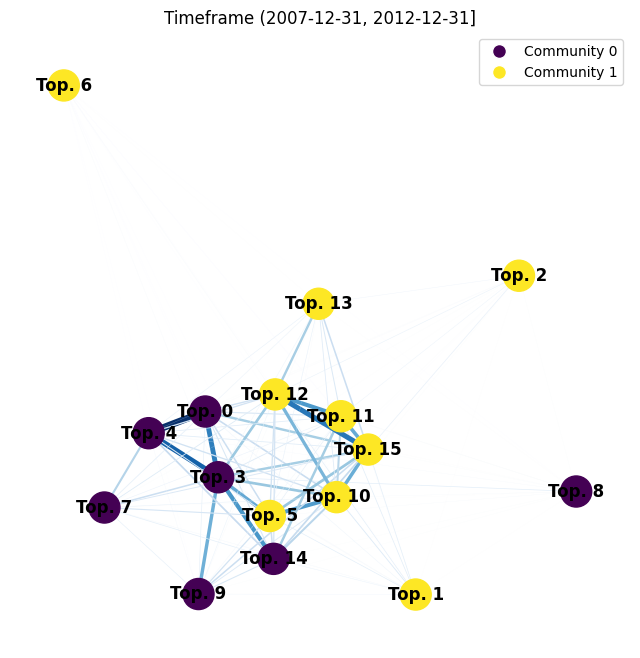

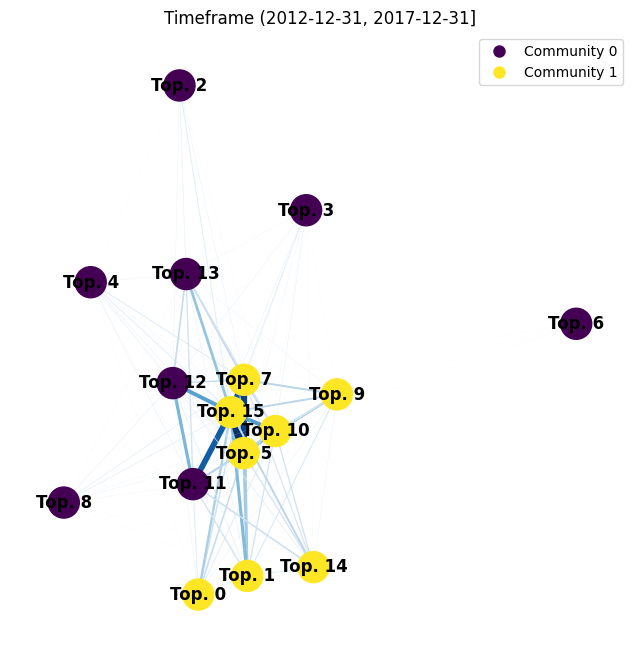

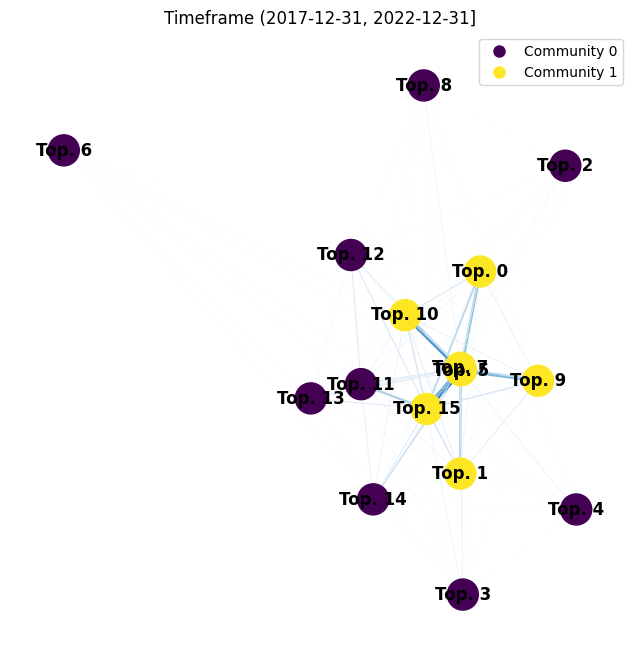

In [ ]:
from community import community_louvain
from matplotlib.lines import Line2D
import pandas as pd


# Convert 'Date_utc' to datetime objects, if it isn't already
allmails_data_time_parsed_utc['Date_utc'] = pd.to_datetime(allmails_data_time_parsed_utc['parsed_dates_uct'])

# Determine the start and end dates of the email data
start_date = pd.to_datetime('1992-01-01')
end_date = pd.to_datetime('2023-01-01')

# Determine the start and end years of the email data
start_year = start_date.year
end_year = end_date.year

# Add a new 'interval_5' column to the DataFrame based on the start and end dates
allmails_data_time_parsed_utc['interval_5'] = pd.cut(allmails_data_time_parsed_utc['Date_utc'], bins=pd.date_range(start=start_date, end=end_date, freq='5Y'))

# Group the dataset by the 'interval_5' column and extract the text column for each group
grouped_docs = allmails_data_time_parsed_utc.groupby('interval_5')['Cleaned_Body_No_Stopwords'].apply(list)

# Convert the grouped data to a dictionary
timeframes = grouped_docs.to_dict() 
timeframe_corpora = {}
for timeframe, docs in timeframes.items():
    dictionary = lda_model.id2word  # Use the dictionary from your existing LDA model
    corpus_0 = [dictionary.doc2bow(doc.split()) for doc in docs]
    timeframe_corpora[timeframe] = corpus_0
    
        
def draw_linkage_network(lda_model, corpus_0, num_topics, title):
    G = nx.Graph()
    for i in range(num_topics):
        G.add_node(i)

    topic_cooccurrence = {(i, j): 0 for i in range(num_topics) for j in range(num_topics) if i != j}
    for doc in lda_model.get_document_topics(corpus_0, minimum_probability=0.1):
        for t1 in doc:
            for t2 in doc:
                if t1[0] != t2[0]:
                    topic_cooccurrence[(t1[0], t2[0])] += 1

    for pair, count in topic_cooccurrence.items():
        G.add_edge(pair[0], pair[1], weight=count)
        

    # Perform Louvain community detection
    partition = community_louvain.best_partition(G)

    # Draw nodes and edges
    pos = nx.spring_layout(G)
    plt.figure(figsize=(8, 8))
    nx.draw_networkx_nodes(G, pos, node_size=500, node_color=list(partition.values()), cmap=plt.cm.viridis)
    edges = G.edges(data=True)
    edge_colors = [edge[2]["weight"] for edge in edges]
    edge_widths = [edge[2]["weight"] / max(edge_colors) * 5 for edge in edges]  # Scale edge widths
    nx.draw_networkx_edges(G, pos, edgelist=edges, edge_color=edge_colors, edge_cmap=plt.cm.Blues, width=edge_widths)

    
    # Add labels to the nodes
    #node_labels = {i: f"Top. {i} (Com. {partition[i]})" for i in range(num_topics)}
    node_labels = {i: f"Top. {i}" for i in range(num_topics)}
    nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=12, font_weight='bold')

    # Create legend
    unique_communities = set(partition.values())
    legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Community {community}',
                              markerfacecolor=plt.cm.viridis(community / (len(unique_communities) - 1)), markersize=10)
                       for community in unique_communities]
    plt.legend(handles=legend_elements, loc='upper right')

    plt.title(title)
    plt.axis("off")
    plt.show()
    
# Call the draw_linkage_network function for each timeframe
for timeframe, corpus_0 in timeframe_corpora.items():
    draw_linkage_network(lda_model, corpus_0, num_topics, f"Timeframe {timeframe}")
    

## Topic Distribution and Dominant Topics

In [ ]:
doc_topics = []
for doc in corpus:
    topic_dist = lda_model.get_document_topics(doc)
    doc_topics.append(topic_dist)
    
dominant_topics = []
for topic_dist in doc_topics:
    if topic_dist:
        dominant_topic = max(topic_dist, key=lambda x: x[1])[0]
        dominant_topics.append(dominant_topic)
    else:
        dominant_topics.append(None)
        
# Add the dominant topic to the DataFrame
allmails_data_time_parsed_utc['dominant_topic'] = dominant_topics

In [ ]:
# Create an empty DataFrame to store topic distributions
topic_distributions_all = pd.DataFrame(columns=range(lda_model.num_topics))

# Fill the DataFrame with topic probabilities for each document
for i, topic_dist in enumerate(doc_topics):
    if topic_dist:
        for topic_prob in topic_dist:
            topic_distributions_all.at[i, topic_prob[0]] = topic_prob[1]
    else:
        for col in topic_distributions_all.columns:
            topic_distributions_all.at[i, col] = None


# Merge the topic distributions DataFrame with the original result DataFrame
allmails_data_time_parsed_utc_topics = pd.concat([allmails_data_time_parsed_utc, topic_distributions_all], axis=1)


In [ ]:
# Print the dominant topic for each document
for i, topic in enumerate(dominant_topics):
    print(f"Document {i+1}: Dominant Topic {topic}")



Document 1: Dominant Topic 12
Document 2: Dominant Topic 10
Document 3: Dominant Topic 11
Document 4: Dominant Topic 11
Document 5: Dominant Topic 6
Document 6: Dominant Topic 15
Document 7: Dominant Topic 7
Document 8: Dominant Topic 13
Document 9: Dominant Topic 12
Document 10: Dominant Topic 12
Document 11: Dominant Topic 11
Document 12: Dominant Topic 12
Document 13: Dominant Topic 14
Document 14: Dominant Topic 10
Document 15: Dominant Topic 7
Document 16: Dominant Topic 11
Document 17: Dominant Topic 11
Document 18: Dominant Topic 11
Document 19: Dominant Topic 5
Document 20: Dominant Topic 7
Document 21: Dominant Topic 9
Document 22: Dominant Topic 4
Document 23: Dominant Topic 1
Document 24: Dominant Topic 10
Document 25: Dominant Topic 4
Document 26: Dominant Topic 1
Document 27: Dominant Topic 0
Document 28: Dominant Topic 1
Document 29: Dominant Topic 4
Document 30: Dominant Topic 9
Document 31: Dominant Topic 4
Document 32: Dominant Topic 12
Document 33: Dominant Topic 12
D

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

# Set seaborn style
sns.set(style='whitegrid')

def calculate_linkage_mi(topic_distributions, num_topics):
    topic_distributions = topic_distributions.fillna(0)  # Convert None values to zeros
    
    pij = np.zeros((num_topics, num_topics))
    pi = np.sum(topic_distributions, axis=0)
    total_count = np.sum(pi)

    for i in range(num_topics):
        for j in range(num_topics):
            pij[i, j] = np.dot(topic_distributions[i], topic_distributions[j])

    pij /= total_count
    pi /= total_count

    with np.errstate(divide='ignore', invalid='ignore'):
        linkage = np.log2(pij / (pi[:, None] * pi[None, :]))
        mutual_information = np.nansum(pij * linkage)

    return linkage, mutual_information


def process_interval(df, start_date, end_date):
    interval_df = allmails_data_time_parsed_utc_topics[(allmails_data_time_parsed_utc_topics['Date_utc'] >= start_date) & (allmails_data_time_parsed_utc_topics['Date_utc'] <= end_date)]
    topic_distributions_filtered = interval_df.loc[:, range(lda_model.num_topics)]
    linkage, mutual_information = calculate_linkage_mi(topic_distributions_filtered, lda_model.num_topics)
    avg_linkage = np.mean(linkage[np.isfinite(linkage)])  # Get the mean linkage ignoring NaN and Inf values
    return avg_linkage, mutual_information


# Define time intervals
date_range = pd.date_range(start='1992-01-01', end='2023-03-01', freq='Y', tz='UTC')  # Added tz='UTC'

# 

linkage_values = []
mutual_information_values = [0] * (len(date_range) - 1)

for i in range(len(date_range) - 1):
    start_interval = date_range[i]
    end_interval = date_range[i + 1]
    avg_linkage, mi = process_interval(allmails_data_time_parsed_utc_topics, start_interval, end_interval)
    linkage_values.append(avg_linkage)
    mutual_information_values[i] = mi

# Create a larger plot
fig, ax = plt.subplots(figsize=(12, 8))  # Adjust the figsize values for the desired size

ax.plot(date_range[:-1], linkage_values, marker='o', label="Linkage")
ax.plot(date_range[:-1], mutual_information_values, marker='x', label="Mutual Information")

# Format date labels
years_fmt = mdates.DateFormatter('%Y')
ax.xaxis.set_major_formatter(years_fmt)

# Add gridlines
ax.grid(True)

# Set axis labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Information Bits')
ax.set_title('Linkage and Mutual Information Over Time')

# Add legend
ax.legend()

# Rotate date labels to avoid overlapping
plt.xticks(rotation=45)

# Display the plot
plt.show()

In [ ]:
import numpy as np

def calculate_growth_factors(df, num_topics, prev_year=None):
    pi = np.sum(df.loc[:, range(num_topics)], axis=0).to_numpy(dtype=np.float64)

    if prev_year is not None:
        pi_prev = np.sum(prev_year.loc[:, range(num_topics)], axis=0).to_numpy(dtype=np.float64)
        prevalence_bias = np.log(pi) - np.log(pi_prev)
        novelty_bias = np.log(pi) - np.log(pi_prev + 1e-10)  # Add a small value to avoid division by zero
    else:
        prevalence_bias = np.zeros(num_topics)
        novelty_bias = np.zeros(num_topics)

    linkage, _ = calculate_linkage_mi(df.loc[:, range(num_topics)], num_topics)
    linkage_bias = np.nanmean(linkage, axis=1)  # Get the mean linkage ignoring NaN and Inf values

    growth_factors = {
        'prevalence_bias': prevalence_bias.flatten(),  # Flatten the arrays
        'novelty_bias': novelty_bias.flatten(),
        'linkage_bias': linkage_bias.flatten()
    }

    return growth_factors

# Initialize a DataFrame to store the growth factors
growth_factors_df = pd.DataFrame(columns=['year', 'prevalence_bias', 'novelty_bias', 'linkage_bias'])

# Calculate growth factors for each year
for i in range(len(date_range) - 1):
    start_interval = date_range[i]
    end_interval = date_range[i + 1]

    interval_df = allmails_data_time_parsed_utc_topics[(allmails_data_time_parsed_utc_topics['Date_utc'] >= start_interval) & (allmails_data_time_parsed_utc_topics['Date_utc'] <= end_interval)]

    if i == 0:
        prev_year = None
    else:
        prev_year = allmails_data_time_parsed_utc_topics[(allmails_data_time_parsed_utc_topics['Date_utc'] >= date_range[i - 1]) & (allmails_data_time_parsed_utc_topics['Date_utc'] <= date_range[i])]

    growth_factors = calculate_growth_factors(interval_df, lda_model.num_topics, prev_year)

    growth_factors_df = growth_factors_df.append({
        'year': start_interval.year,
        'prevalence_bias': growth_factors['prevalence_bias'],
        'novelty_bias': growth_factors['novelty_bias'],
        'linkage_bias': growth_factors['linkage_bias']
    }, ignore_index=True)


In [ ]:
def calculate_completion_bias(df, num_topics):
    pi = np.sum(df.loc[:, range(num_topics)], axis=0).to_numpy(dtype=np.float64)
    ni = df.shape[0]
    ni_min = np.sum(pi > 0)

    completion_bias = np.log(ni / (ni + ni_min)) - np.log(pi + 1e-10)  # Add a small value to avoid division by zero

    return completion_bias


def calculate_exclusion_bias(df, num_topics):
    pi = np.sum(df.loc[:, range(num_topics)], axis=0).to_numpy(dtype=np.float64)
    ni = df.shape[0]
    ni_min = np.sum(pi > 0)

    exclusion_bias = np.log(ni_min / ni) - np.log(1 - pi + 1e-10)  # Add a small value to avoid division by zero

    return exclusion_bias


In [ ]:

def calculate_additional_biases(df, num_topics):
    completion_bias = calculate_completion_bias(df, num_topics)
    exclusion_bias = calculate_exclusion_bias(df, num_topics)

    biases = {
        'completion_bias': completion_bias.flatten(),
        'exclusion_bias': exclusion_bias.flatten()
    }

    return biases

In [ ]:
completion_bias_df = pd.DataFrame(columns=['year', 'completion_bias'])
exclusion_bias_df = pd.DataFrame(columns=['year', 'exclusion_bias'])

for i in range(len(date_range) - 1):
    start_interval = date_range[i]
    end_interval = date_range[i + 1]

    interval_df = allmails_data_time_parsed_utc_topics[(allmails_data_time_parsed_utc_topics['Date_utc'] >= start_interval) & (allmails_data_time_parsed_utc_topics['Date_utc'] <= end_interval)]

    biases = calculate_additional_biases(interval_df, lda_model.num_topics)

    completion_bias_df = completion_bias_df.append({
        'year': start_interval.year,
        'completion_bias': biases['completion_bias']
    }, ignore_index=True)

    exclusion_bias_df = exclusion_bias_df.append({
        'year': start_interval.year,
        'exclusion_bias': biases['exclusion_bias']
    }, ignore_index=True)

In [ ]:
merged_df = pd.concat([growth_factors_df, completion_bias_df.drop('year', axis=1), exclusion_bias_df.drop('year', axis=1)], axis=1)
merged_df

In [ ]:
import numpy as np
import pandas as pd
from scipy import stats
import ast

# Group by 5-year periods
merged_df['year'] = pd.to_datetime(merged_df['year'], format='%Y')
grouped_by_5_years = merged_df.groupby(pd.Grouper(key='year', freq='5Y'))

bias_cols = ['prevalence_bias', 'novelty_bias', 'linkage_bias', 'completion_bias', 'exclusion_bias']

# Convert numpy arrays to lists
for col in bias_cols:
    merged_df[col] = merged_df[col].apply(list)



def regression_to_mean(x, y):
    x = np.array(x).astype(float)
    y = np.array([float(val) for sublist in y for val in sublist])
    
    xy_pairs = list(zip(x, y))
    filtered_pairs = [(x_val, y_val) for x_val, y_val in xy_pairs if not np.isnan(y_val)]
    
    if len(filtered_pairs) < 2:
        return (np.nan, np.nan)

    x_filtered, y_filtered = zip(*filtered_pairs)
    x_filtered = np.array(x_filtered)
    y_filtered = np.array(y_filtered)
    
    with np.errstate(invalid='ignore'):
        slope, intercept, r_value, p_value, std_err = stats.linregress(x_filtered, y_filtered)
        rtm = slope * (x_filtered - x_filtered.mean()) + y_filtered.mean()
    
    return rtm, p_value

# Apply regression to mean for each 5-year period
regression_to_mean_by_5_years = {}
for period, group in grouped_by_5_years:
    prevalence_bias_rtm, prevalence_bias_p_value = regression_to_mean(group['year'].values, group['prevalence_bias'].values)
    novelty_bias_rtm, novelty_bias_p_value = regression_to_mean(group['year'].values, group['novelty_bias'].values)
    linkage_bias_rtm, linkage_bias_p_value = regression_to_mean(group['year'].values, group['linkage_bias'].values)
    completion_bias_rtm, completion_bias_p_value = regression_to_mean(group['year'].values, group['completion_bias'].values)
    exclusion_bias_rtm, exclusion_bias_p_value = regression_to_mean(group['year'].values, group['exclusion_bias'].values)
    print(f'Period: {period.year} - Prevalence Bias RTM: {prevalence_bias_rtm}, P-value: {prevalence_bias_p_value}')

    regression_to_mean_by_5_years[period] = {
        'prevalence_bias_rtm': prevalence_bias_rtm,
        'prevalence_bias_p_value': prevalence_bias_p_value,
        'novelty_bias_rtm': novelty_bias_rtm,
        'novelty_bias_p_value': novelty_bias_p_value,
        'linkage_bias_rtm': linkage_bias_rtm,
        'linkage_bias_p_value': linkage_bias_p_value,
        'completion_bias_rtm': completion_bias_rtm,
        'completion_bias_p_value': completion_bias_p_value,
        'exclusion_bias_rtm': exclusion_bias_rtm,
        'exclusion_bias_p_value': exclusion_bias_p_value,
    }

# Print results

for period, results in regression_to_mean_by_5_years.items():
    print(f"5-Year Period {period}:")
    print(f"  Prevalence bias regression to the mean: {results['prevalence_bias_rtm']}")
    print(f"  Prevalence bias p-value: {results['prevalence_bias_p_value']}")
    print(f"  Novelty bias regression to the mean: {results['novelty_bias_rtm']}")
    print(f"  Novelty bias p-value: {results['novelty_bias_p_value']}")
    print(f"  Linkage bias regression to the mean: {results['linkage_bias_rtm']}")
    print(f"  Linkage bias p-value: {results['linkage_bias_p_value']}")
    print(f"  Completion bias regression to the mean: {results['completion_bias_rtm']}")
    print(f"  Completion bias p-value: {results['completion_bias_p_value']}")
    print(f"  Exclusion bias regression to the mean: {results['exclusion_bias_rtm']}")
    print(f"  Exclusion bias p-value: {results['exclusion_bias_p_value']}")
    print()


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-35-b4008f9b4859>", line 7, in <cell line: 7>
    merged_df['year'] = pd.to_datetime(merged_df['year'], format='%Y')
NameError: name 'merged_df' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2099, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "/usr/lo

In [ ]:
# Convert 'Date_utc' to datetime objects, if it isn't already
allmails_data_time_parsed_utc['Date_utc'] = pd.to_datetime(allmails_data_time_parsed_utc['parsed_dates_uct'])

# Create a new column called 'interval' containing the interval information as years
allmails_data_time_parsed_utc['interval'] = allmails_data_time_parsed_utc['Date_utc'].dt.to_period('Y')

# Group data by intervals and count the occurrences of each topic
topic_counts = allmails_data_time_parsed_utc.groupby('interval')['dominant_topic'].value_counts().unstack().fillna(0)

print(topic_counts)

dominant_topic      0       1       2      3       4      5      6       7   \
interval                                                                      
1992               9.0    45.0    10.0   36.0   187.0   16.0   22.0    66.0   
1993              87.0   451.0    47.0  253.0  1804.0  142.0  233.0   846.0   
1994             185.0   847.0   187.0  779.0  1983.0  476.0  511.0  1577.0   
1995             153.0   548.0    63.0  537.0  1323.0  596.0  594.0  1113.0   
1996             421.0  2430.0   195.0  699.0  2717.0  812.0  747.0  3013.0   
1997             361.0  2641.0   190.0  303.0  2833.0  676.0  653.0  2304.0   
1998             196.0  1030.0    58.0  232.0  1114.0  303.0  225.0   694.0   
1999             208.0    23.0     0.0    5.0     7.0    3.0    1.0    11.0   
2000             445.0   534.0    31.0   71.0   620.0  201.0   65.0   597.0   
2001            1147.0  3008.0   211.0  135.0  1673.0  118.0  128.0  1390.0   
2002             368.0   305.0   129.0   77.0   477.

/Users/dianavieirafernandes/.pyenv/versions/3.7.3/lib/python3.7/site-packages/pandas/core/arrays/datetimes.py:1146: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


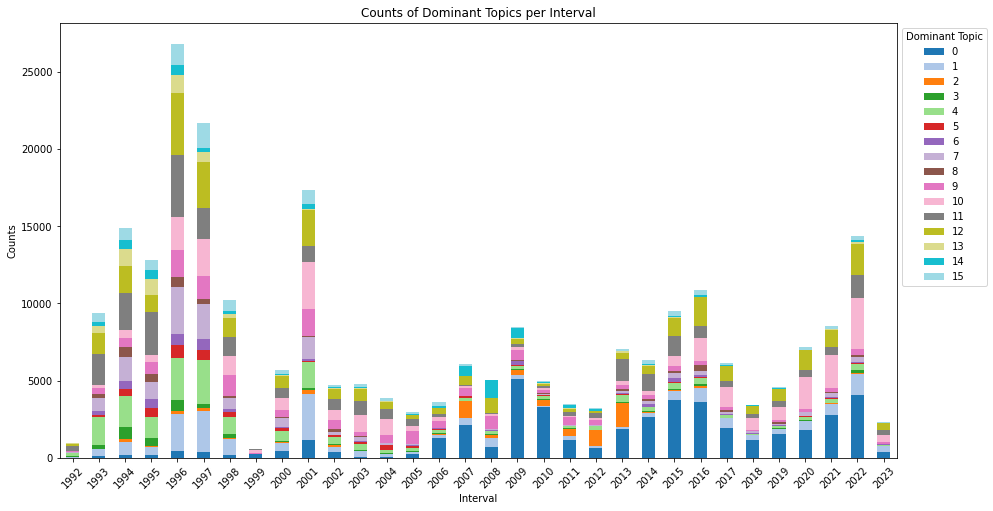

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'topic_counts' is your DataFrame with the counts of each topic within each interval

# Create a stacked bar chart
ax = topic_counts.plot(kind='bar', stacked=True, figsize=(15, 8), colormap='tab20')

# Customize the chart appearance
plt.title('Counts of Dominant Topics per Interval')
plt.xlabel('Interval')
plt.ylabel('Counts')
plt.xticks(rotation=45)
plt.legend(title='Dominant Topic', loc='upper left', bbox_to_anchor=(1, 1))

# Display the chart
plt.show()

In [ ]:
# Extract top words for each topic
topic_labels = []
for topic in lda_model.show_topics(num_topics=num_topics, formatted=False):
    top_words = ', '.join([word[0] for word in topic[1]])
    topic_labels.append(f'Topic {topic[0]+1}: {top_words}')

# Modify topic labels
# Remove 'Topic 1: ' from the first element
topic_labels[0] = topic_labels[0].replace('Topic 1: ', '')

# Extract the first three words from the rest of the elements
custom_labels = [' '.join(topic.split()[2:5]) for topic in topic_labels]

# Print the modified list of topics
print(custom_labels)

['id, hash, cpunk,', 'wrote, john, mm,', 'ia, ai, ii,', 'number, wrote, quantum,', 'email, tor, reply,', 'wrote, hettinga, usa,', 'signature, end, signed,', 'wrote, crypto, tim,', 'tor, us, wrote,', 'report, security, said,', 'us, said, wrote,', 'data, wrote, using,', 'money, wrote, much,', 'server, version, public,', 'watches, wrote, replica,', 'law, court, states,']


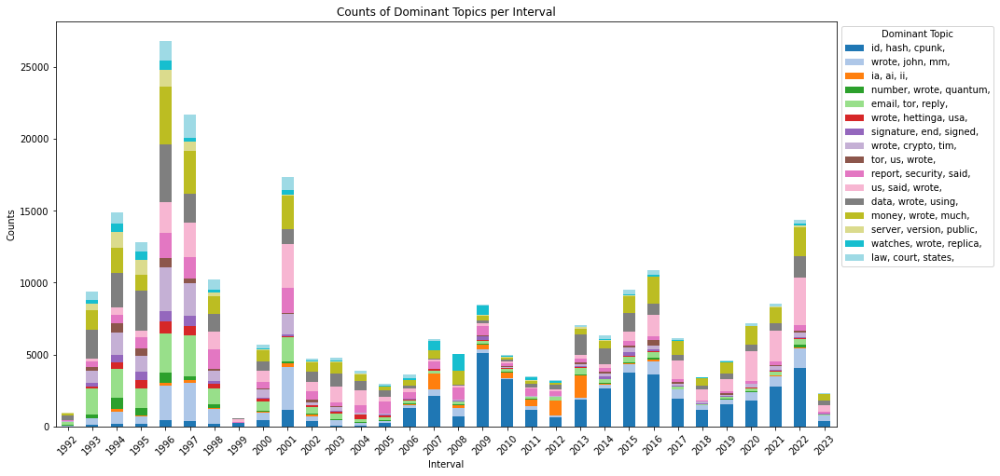

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


# Create a stacked bar chart
ax = topic_counts.plot(kind='bar', stacked=True, figsize=(15, 8), colormap='tab20')

# Customize the chart appearance
plt.title('Counts of Dominant Topics per Interval')
plt.xlabel('Interval')
plt.ylabel('Counts')
plt.xticks(rotation=45)
plt.legend(custom_labels, title='Dominant Topic', loc='upper left', bbox_to_anchor=(1, 1))

# Display the chart
plt.show()

In [ ]:
doc_topics

[[(1, 0.11447636), (7, 0.330067), (10, 0.1682275), (12, 0.37963498)],
 [(8, 0.11673563), (10, 0.8433126)],
 [(4, 0.27510786), (10, 0.12207178), (11, 0.5788707)],
 [(1, 0.30643803), (11, 0.6633487)],
 [(6, 0.5713252), (11, 0.4233364)],
 [(6, 0.12642308), (8, 0.39684793), (15, 0.47039622)],
 [(7, 0.8121557)],
 [(3, 0.5309856)],
 [(10, 0.25060314), (12, 0.6023255)],
 [(10, 0.15857376), (12, 0.64326674), (15, 0.17435133)],
 [(6, 0.27725884), (10, 0.35020024), (11, 0.3585402)],
 [(7, 0.11270594), (10, 0.37704262), (12, 0.506373)],
 [(11, 0.11865631), (13, 0.30448017), (14, 0.4068223), (15, 0.16814277)],
 [(7, 0.17321396), (9, 0.22341397), (10, 0.3061299), (15, 0.19741915)],
 [(7, 0.82705986)],
 [(11, 0.5624812), (15, 0.11770827)],
 [(11, 0.9122906)],
 [(6, 0.19536722), (11, 0.70329964)],
 [(5, 0.5005839), (10, 0.4456967)],
 [(7, 0.66408587), (12, 0.2249436)],
 [(7, 0.15879987), (9, 0.38356054), (10, 0.2416846), (15, 0.18383773)],
 [(4, 0.48043874), (7, 0.15228286), (12, 0.36201313)],
 [(1, 

## KL Divergence

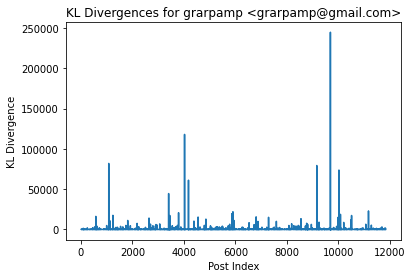

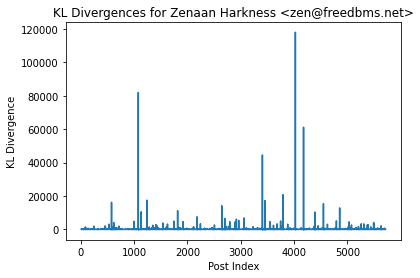

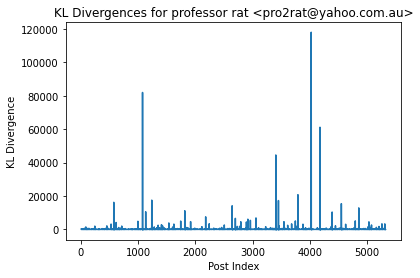

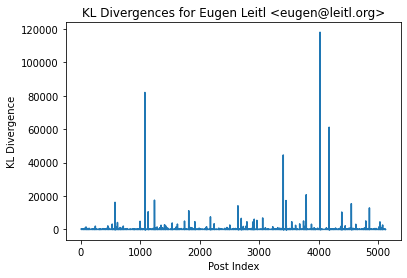

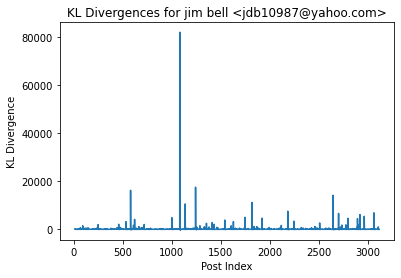

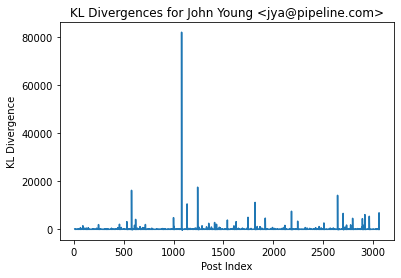

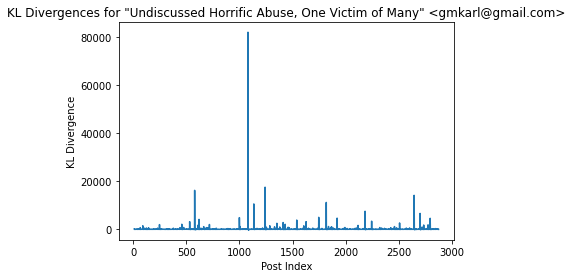

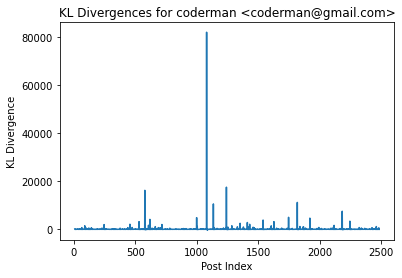

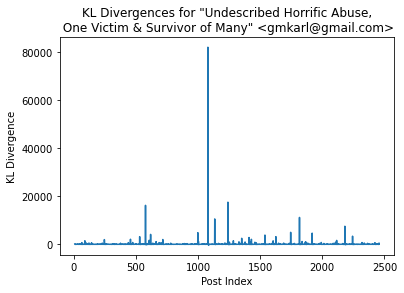

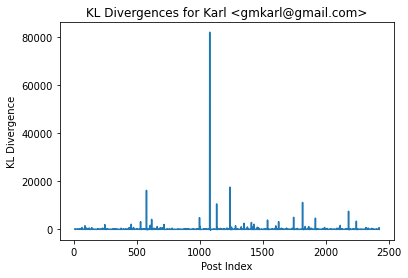

In [ ]:
import pandas as pd
import numpy as np

# Select the top 10 users with the most posts
top_users = allmails_data_time_parsed_utc['From'].value_counts().nlargest(10).index.tolist()

# Initialize an empty list to store the KL divergences for each user
kl_divergences_by_user = {}

# Loop over each top user and calculate the KL divergences for their posts
for user in top_users:
    # Subset the data for that user
    user_data = allmails_data_time_parsed_utc[allmails_data_time_parsed_utc['From'] == user]

    # Sort the data by date/time
    user_data = user_data.sort_values('parsed_dates_uct')

    # Initialize an empty list to store the KL divergences
    kl_divergences = []
    
    # Initialize a list to store the last 10 distributions
    last_10_distributions = []
    
    # Loop over each post and calculate the KL divergence from the previous average of last 10 distributions
    for i in range(1, len(user_data)):
        current_post = np.array([tup[1] for tup in doc_topics[i]])
        current_distribution = np.histogram(current_post, bins=10, density=True)[0]
        
        # If there are at least 10 previous posts, calculate the previous average of the last 10 distributions
        if i >= 10:
            previous_distributions = last_10_distributions[-10:]
            previous_average = np.mean(previous_distributions, axis=0)
            
            # Calculate the KL divergence between the current distribution and the previous average
            kl_divergence = 0.0
            for j in range(len(current_distribution)):
                if current_distribution[j] > 0 and previous_average[j] > 0:
                    kl_divergence += current_distribution[j] * np.log(current_distribution[j] / previous_average[j])
            kl_divergence /= np.log(2)
            
        else:
            kl_divergence = np.nan
        
        # Append the KL divergence to the list
        kl_divergences.append(kl_divergence)
        
        # Append the current distribution to the last 10 distributions
        last_10_distributions.append(current_distribution)
    
    # Add the list of KL divergences to the dictionary
    kl_divergences_by_user[user] = kl_divergences
    
# Loop over the dictionary of KL divergences for each user
for user, kl_divergences in kl_divergences_by_user.items():
    # Convert the list of KL divergences to a NumPy array
    kl_divergences_array = np.array(kl_divergences)

    # Create a plot of the KL divergences
    fig, ax = plt.subplots()
    ax.plot(kl_divergences_array.T)
    ax.set_title(f'KL Divergences for {user}')
    ax.set_xlabel('Post Index')
    ax.set_ylabel('KL Divergence')
    plt.show()

# Print the dictionary of KL divergences by user
#print(kl_divergences_by_user)


## Novelty, Transience, and Resonance

In [ ]:
def novelty_transience_resonance(topic_distributions, scale):
    
    def kl_div(p, q):
        epsilon = 1e-10
        p_safe = p + epsilon
        q_safe = q + epsilon
        return np.sum(p_safe * np.log(p_safe / q_safe), axis=1)

    n_docs, n_topics = topic_distributions.shape
    window_size = scale // 2

    # Pad the topic distributions with zeros on either side
    padded_topic_dists = np.pad(topic_distributions, ((window_size, window_size), (0, 0)), mode='constant')

    # Calculate novelty, transience, and resonance for each document
    novelties = []
    transiences = []
    resonances = []

    for i in range(n_docs):
        center_dist = padded_topic_dists[i + window_size].reshape(1, -1)
        before_dists = padded_topic_dists[i:i + window_size].reshape(-1, n_topics)
        after_dists = padded_topic_dists[i + window_size + 1:i + scale + 1].reshape(-1, n_topics)

        novelty = np.mean(kl_div(before_dists, center_dist))
        transience = np.mean(kl_div(after_dists, center_dist))
        resonance = (novelty + transience) / 2

        novelties.append(novelty)
        transiences.append(transience)
        resonances.append(resonance)

    return np.array(novelties), np.array(transiences), np.array(resonances)


In [ ]:
doc_topics = []
for doc in corpus:
    topic_dist = lda_model.get_document_topics(doc)
    doc_topics.append(topic_dist)
    
        
# Add the dominant topic to the DataFrame
#allmails_data_time_parsed_utc['topics_distributions'] = doc_topics
len(doc_topics)

251799

In [ ]:
n_topics = 16
topic_distributions = np.zeros((len(doc_topics), n_topics))

for i, doc_topic_dist in enumerate(doc_topics):
    for topic_id, topic_weight in doc_topic_dist:
        topic_distributions[i, topic_id] = topic_weight


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import matplotlib.lines as mpl_lines
import seaborn as sns

def novelty_transience_resonance(topic_distributions, scale):
    
    def kl_div(p, q):
        epsilon = 1e-10
        p_safe = p + epsilon
        q_safe = q + epsilon
        return np.sum(p_safe * np.log(p_safe / q_safe), axis=1)

    n_docs, n_topics = topic_distributions.shape
    window_size = scale // 2

    # Pad the topic distributions with zeros on either side
    padded_topic_dists = np.pad(topic_distributions, ((window_size, window_size), (0, 0)), mode='constant')

    # Calculate novelty, transience, and resonance for each document
    novelties = []
    transiences = []
    resonances = []

    for i in range(n_docs):
        center_dist = padded_topic_dists[i + window_size].reshape(1, -1)
        before_dists = padded_topic_dists[i:i + window_size].reshape(-1, n_topics)
        after_dists = padded_topic_dists[i + window_size + 1:i + scale + 1].reshape(-1, n_topics)

        novelty = np.mean(kl_div(before_dists, center_dist))
        transience = np.mean(kl_div(after_dists, center_dist))
        resonance = (novelty + transience) / 2

        novelties.append(novelty)
        transiences.append(transience)
        resonances.append(resonance)

    return np.array(novelties), np.array(transiences), np.array(resonances)


n_topics = 16
topic_distributions = np.zeros((len(doc_topics), n_topics))

for i, doc_topic_dist in enumerate(doc_topics):
    for topic_id, topic_weight in doc_topic_dist:
        topic_distributions[i, topic_id] = topic_weight

# Calculate novelty, transience, and resonance with a scale of 10
novelties, transiences, resonances = novelty_transience_resonance(topic_distributions, scale=10)

# Create a dataframe to store the novelty, transience, and resonance for each document
ntr_by_doc = pd.DataFrame({
    'novelties': novelties,
    'transiences': transiences,
    'resonances': resonances
})


def plot_density(ntr_data):
    figsize = (12, 5)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

    # Transience vs. Novelty
    sns.kdeplot(x=ntr_data['novelties'], y=ntr_data['transiences'], ax=ax1, cmap="viridis", shade=True)
    ax1.set_xlabel('Novelty')
    ax1.set_ylabel('Transience')
    ax1.set_title('Transience vs. Novelty')

    # Resonance vs. Novelty
    sns.kdeplot(x=ntr_data['novelties'], y=ntr_data['resonances'], ax=ax2, cmap="viridis", shade=True)
    ax2.set_xlabel('Novelty')
    ax2.set_ylabel('Resonance')
    ax2.set_title('Resonance vs. Novelty')

    plt.tight_layout()
    plt.savefig('density_plots.png', dpi=300)
    plt.show()



{'grarpamp <grarpamp@gmail.com>': {'novelties': array([-2.30092225e-09,  1.00801915e-08,  1.19986621e-01, ...,
        8.60427667e+00,  1.22474703e+01,  1.36807514e+01]), 'transiences': array([ 4.75070104e+00,  6.88094521e+00,  6.05132655e+00, ...,
        1.68255830e+00,  3.19185532e+00, -4.38216337e-09]), 'resonances': array([2.37535052, 3.44047261, 3.08565659, ..., 5.14341748, 7.71966279,
       6.8403757 ])}, 'Zenaan Harkness <zen@freedbms.net>': {'novelties': array([-6.48676865e-09, -6.20255968e-04,  6.12670525e+00, ...,
        1.15261895e+01,  1.58302646e+01,  1.07230422e+01]), 'transiences': array([ 1.40143258e+01,  1.84856571e+01,  1.72391164e+01, ...,
        7.38901521e+00,  2.07038807e+00, -6.55194070e-09]), 'resonances': array([ 7.00716288,  9.24251843, 11.68291081, ...,  9.45760233,
        8.95032634,  5.3615211 ])}, 'professor rat <pro2rat@yahoo.com.au>': {'novelties': array([ 0.        ,  0.        ,  0.        , ..., 12.37723835,
       12.9577905 , 15.35392162]), 'tr

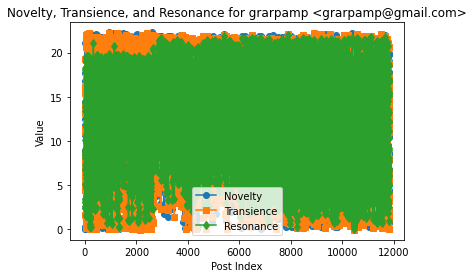

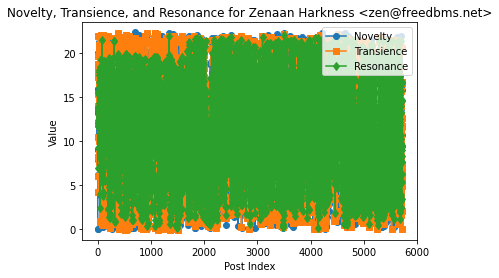

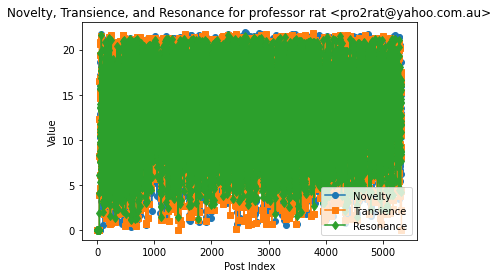

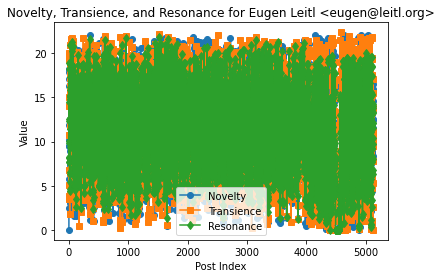

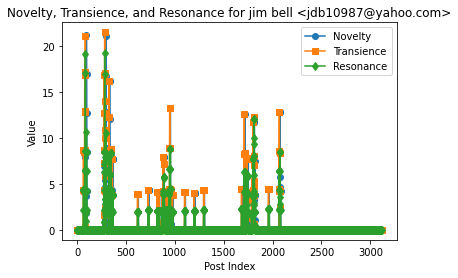

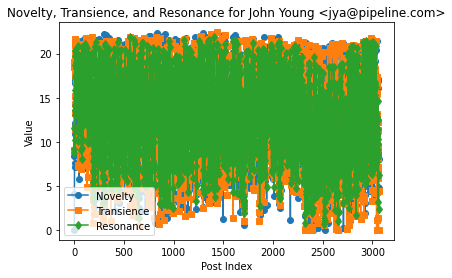

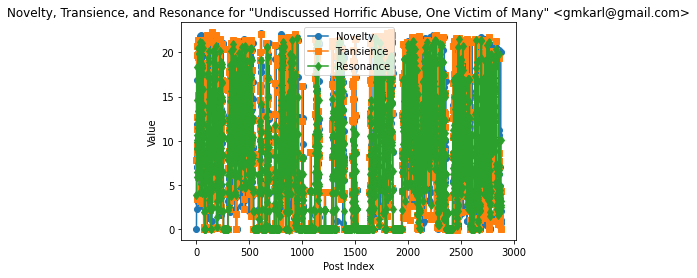

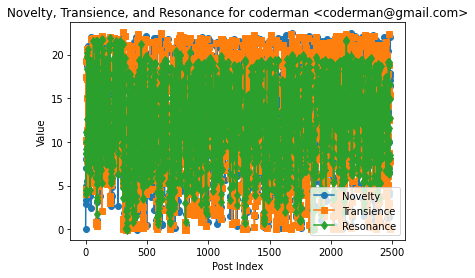

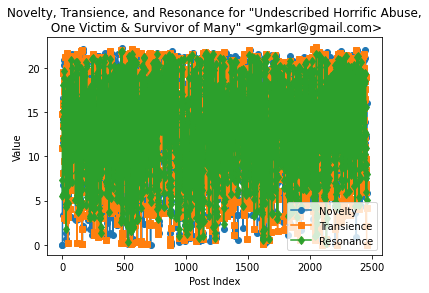

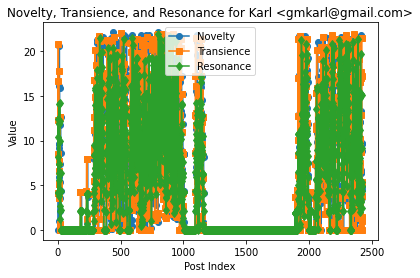

In [ ]:
n_samples = 10000  # Choose the number of samples to plot
ntr_data_sample = ntr_by_doc.sample(n_samples, random_state=42)
plot_density(ntr_data_sample)

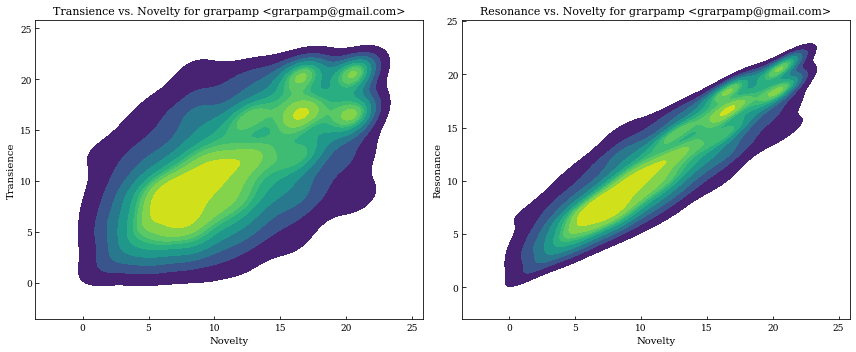

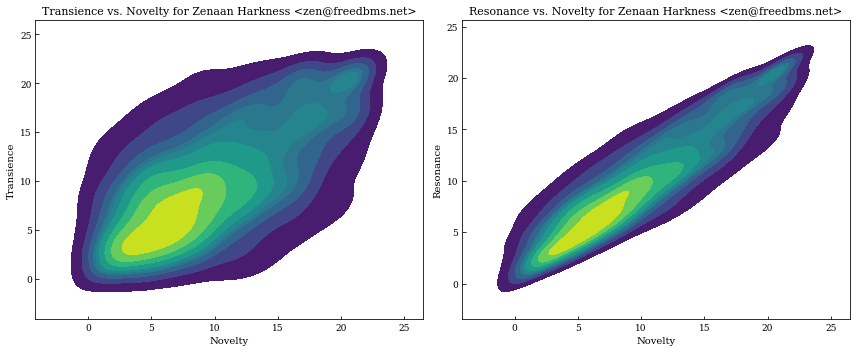

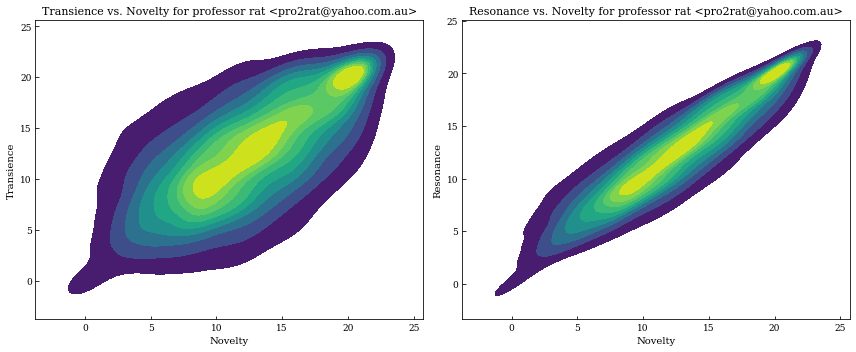

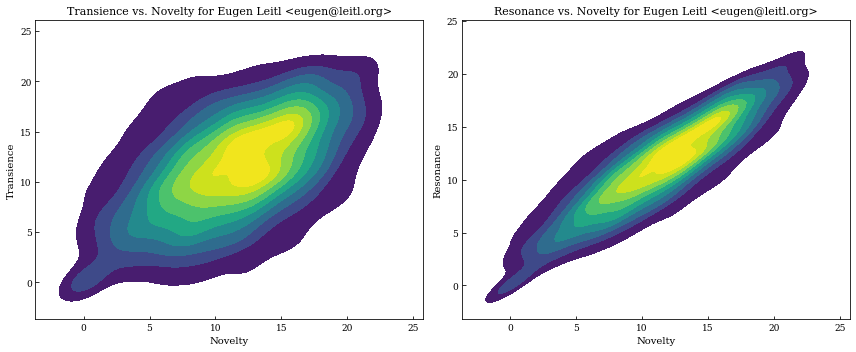

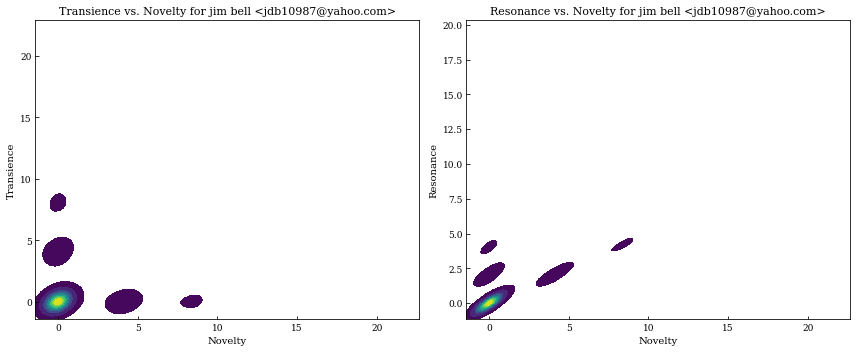

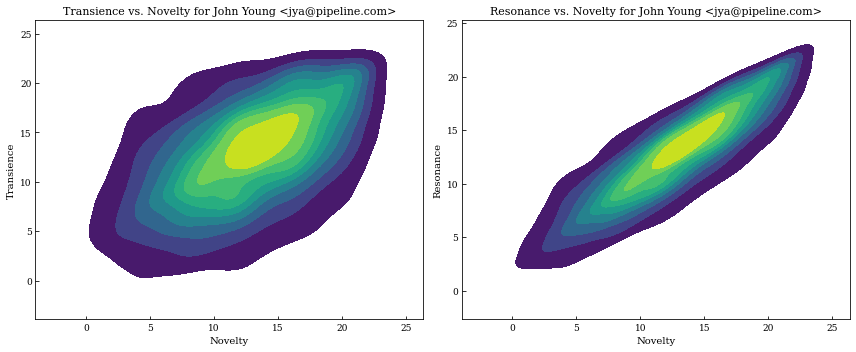

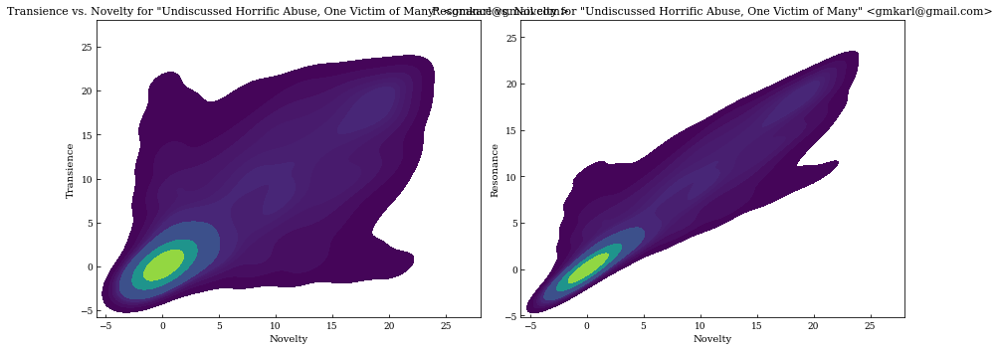

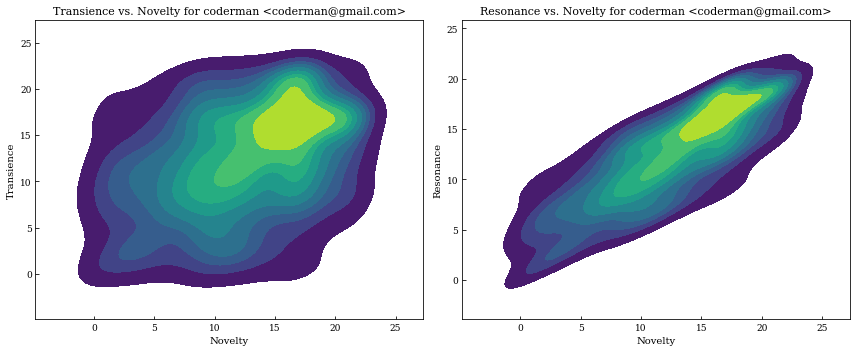

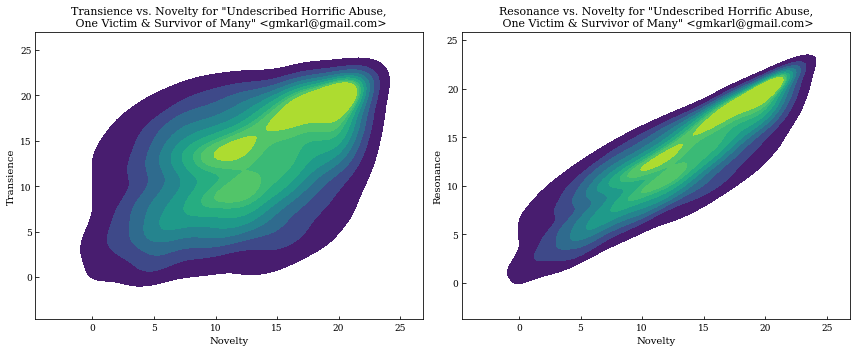

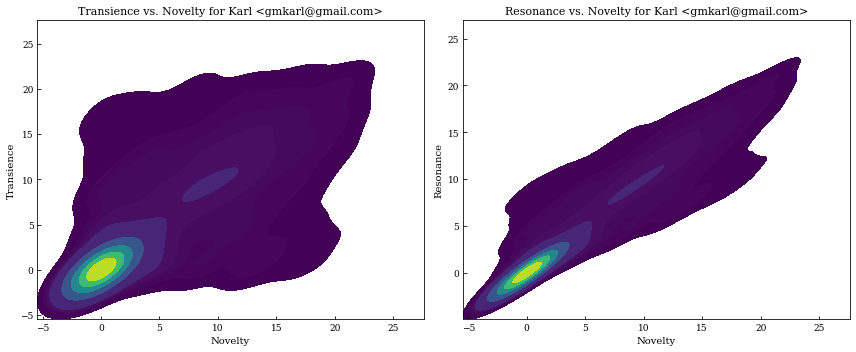

In [ ]:
# Create a copy of the original dataframe with just the index column
df_index = allmails_data_time_parsed_utc.copy()

merged_df_final = pd.concat([allmails_data_time_parsed_utc, ntr_by_doc], axis=1)

merged_df_final.to_csv('merged_data.csv', index=False)

The density plots for Transience vs. Novelty and Resonance vs. Novelty provide insights into the patterns of novelty, transience, and resonance in the messages posted by users. Here's a brief explanation of these values:

Novelty: How new or original a message is compared to previous messages. Higher novelty values indicate that the message contains more unique or original content.
Transience: How quickly a message's content becomes outdated or irrelevant. Higher transience values indicate that the message's content has a shorter lifespan.
Resonance: The lasting impact or influence of a message. Higher resonance values indicate that the message's content has a longer-lasting influence on subsequent messages.
Now let's interpret the plots:

Transience vs. Novelty
In this plot, you can observe the relationship between the novelty of a message and its transience. Generally, there might be a few patterns:

Messages with high novelty and low transience: These messages contain original content that has a longer-lasting impact on the discussion.
Messages with low novelty and high transience: These messages contain repetitive content that quickly becomes outdated.
Messages with high novelty and high transience: These messages contain original content, but the content quickly becomes outdated.
Messages with low novelty and low transience: These messages contain repetitive content, but the content has a lasting impact on the discussion.
Resonance vs. Novelty
In this plot, you can observe the relationship between the novelty of a message and its resonance. There might be a few patterns:

Messages with high novelty and high resonance: These messages contain original content that has a significant impact on the discussion.
Messages with low novelty and low resonance: These messages contain repetitive content that does not have a strong impact on the discussion.
Messages with high novelty and low resonance: These messages contain original content, but the content does not have a lasting impact on the discussion.
Messages with low novelty and high resonance: These messages contain repetitive content, but the content has a significant impact on the discussion.
By analyzing these plots, you can get a sense of the originality and impact of each user's messages. Users with high novelty and resonance scores are likely contributing valuable and influential content to the discussions.

In this KDE plot, the colors represent the density of data points in the two-dimensional space of novelty (x-axis) and resonance (y-axis). The color map "viridis" is a perceptually uniform color map, which means that it is designed to be easy to interpret and to provide a clear visual representation of data. The color map ranges from dark purple for low-density areas to bright yellow for high-density areas.

Here's what the colors mean in this context:

Dark purple (low-density areas): Few data points are found in this region of the plot. This indicates that there are not many messages with the corresponding levels of novelty and resonance.
Lighter shades of blue and green (medium-density areas): More data points are found in these regions of the plot. This indicates that there is a moderate number of messages with the corresponding levels of novelty and resonance.
Bright yellow (high-density areas): The highest density of data points is found in these regions of the plot. This indicates that many messages have the corresponding levels of novelty and resonance.
By observing the colors in the KDE plot, you can get a sense of how common certain combinations of novelty and resonance are among the messages in your dataset.

# Sentiment

In [ ]:
import pandas as pd
from textblob import TextBlob

def get_sentiment(text):
    blob = TextBlob(text)
    return blob.sentiment.polarity, blob.sentiment.subjectivity

allmails_data_time_parsed_utc['sentiment_polarity'], allmails_data_time_parsed_utc['sentiment_subjectivity'] = zip(*allmails_data_time_parsed_utc['Cleaned_Body'].apply(get_sentiment))

def classify_sentiment(polarity):
    if polarity > 0:
        return "positive"
    elif polarity == 0:
        return "neutral"
    else:
        return "negative"
    
allmails_data_time_parsed_utc['sentiment'] = allmails_data_time_parsed_utc['sentiment_polarity'].apply(classify_sentiment)


In [ ]:
negative_sentiment_data = allmails_data_time_parsed_utc[allmails_data_time_parsed_utc['sentiment'] == 'negative']
negative_topic_counts = negative_sentiment_data['dominant_topic'].value_counts()
total_topic_counts = allmails_data_time_parsed_utc['dominant_topic'].value_counts()
negative_sentiment_proportion = negative_topic_counts / total_topic_counts
sorted_negative_sentiment_proportion = negative_sentiment_proportion.sort_values(ascending=False)
print("Topics sorted by the proportion of negative sentiment:")
print(sorted_negative_sentiment_proportion)

Topics sorted by the proportion of negative sentiment:
4     0.258929
8     0.246631
2     0.223645
15    0.223426
3     0.199396
9     0.178527
1     0.176633
6     0.165675
13    0.163742
12    0.145950
14    0.143364
11    0.141274
7     0.129201
5     0.086418
10    0.077729
0     0.030181
Name: dominant_topic, dtype: float64


In [ ]:
topic_labels_map = {index: label for index, label in enumerate(custom_labels)}
sorted_negative_sentiment_proportion.index = sorted_negative_sentiment_proportion.index.map(topic_labels_map)
print("Topics sorted by the proportion of negative sentiment:")
print(sorted_negative_sentiment_proportion)

Topics sorted by the proportion of negative sentiment:
wrote, us, world,                0.258929
court, law, case,                0.246631
crypto, random, code,            0.223645
wrote, want, signature,          0.223426
remailer, address, email,        0.199396
said, security, intelligence,    0.178527
unsubscribe, wrote, declan,      0.176633
public, file, ftp,               0.165675
code, wrote, security,           0.163742
security, encryption, data,      0.145950
money, crypto, digital,          0.143364
watches, replica, wrote,         0.141274
biden, free, gas,                0.129201
tor, ia, ai,                     0.086418
report, internet, save,          0.077729
law, internet, said,             0.030181
Name: dominant_topic, dtype: float64


In [ ]:
# Get the number of posts per topic
posts_per_topic = allmails_data_time_parsed_utc.groupby('dominant_topic').size()

# Map the topic labels
topic_labels_map = {index: label for index, label in enumerate(custom_labels)}
posts_per_topic.index = posts_per_topic.index.map(topic_labels_map)

# Print the number of posts per topic
print("Number of posts per topic:")
print(posts_per_topic)

Number of posts per topic:
dominant_topic
law, internet, said,             55002
unsubscribe, wrote, declan,       3980
crypto, random, code,             4999
remailer, address, email,         6951
wrote, us, world,                52304
tor, ia, ai,                      8644
public, file, ftp,                3193
biden, free, gas,                 8243
court, law, case,                 7347
said, security, intelligence,    12900
report, internet, save,          21858
watches, replica, wrote,          6045
security, encryption, data,       9976
code, wrote, security,           15274
money, crypto, digital,          11272
wrote, want, signature,          23811
dtype: int64


In [ ]:
allmails_data_time_parsed_utc

,From,To,Message-ID,Date,Subject,In-Reply-To,MIME-Version,Content-Type,Body,parsed_dates,...,Cleaned_Body,Lemmatized_Body,Tokenized_Lemmatized_Body,Cleaned_Body_No_Stopwords,dominant_topic,Date_utc,interval,sentiment_polarity,sentiment_subjectivity,sentiment
0,cornpop@glia.biostr.washington.edu (Dan Lieber...,cypherpunks@toad.com,<9401010953.AA09462@glia.biostr.washington.edu>,"Sat, 1 Jan 94 01:48:39 PST",All of this Death Threat Shit.,NaN,1.0,text/plain,\nHello Fellow CypherPunks....\n\nI've never p...,1994-01-01 01:48:39-08:00,...,hello fellow cypherpunks i ve never posted to...,hello fellow cypherpunks i ve never post to th...,"[hello, fellow, cypherpunks, i, ve, never, pos...",hello fellow cypherpunks ve never posted befor...,4,1994-01-01 09:48:39+00:00,1994,-0.022130,0.462407,negative
1,ferguson@icm1.icp.net (Paul Ferguson),cornpop@glia.biostr.washington.edu (Dan Lieber...,<9401011651.AA22931@icm1.icp.net>,"Sat, 1 Jan 94 08:54:22 PST",Re: All of this Death Threat Shit.,<9401010953.AA09462@glia.biostr.washington.edu>,1.0,text,\n\nDan Lieberman wrote - \n \n> That's how it...,1994-01-01 08:54:22-08:00,...,dan lieberman wrote that s how it should have...,dan lieberman write that s how it should have ...,"[dan, lieberman, write, that, s, how, it, shou...",dan lieberman wrote should gone left is forgiv...,4,1994-01-01 16:54:22+00:00,1994,0.167172,0.574369,positive
2,"""Perry E. Metzger"" <pmetzger@lehman.com>",Jim_Miller@bilbo.suite.com,<199401011716.MAA28882@snark>,"Sat, 1 Jan 94 09:19:02 PST",Re: Anonymous Video on Demand,<9312312259.AA25911@bilbo.suite.com>,1.0,text/plain,\n\nJim Miller says:\n> The Customer and the V...,1994-01-01 09:19:02-08:00,...,jim miller says the customer and the video pr...,jim miller say the customer and the video prov...,"[jim, miller, say, the, customer, and, the, vi...",jim miller says customer video provider engage...,12,1994-01-01 17:19:02+00:00,1994,0.162500,0.662500,positive
3,"""Perry E. Metzger"" <pmetzger@lehman.com>",Jim_Miller@bilbo.suite.com,<199401011723.MAA28889@snark>,"Sat, 1 Jan 94 09:28:49 PST",Re: Anonymous Video on Demand,<9401010055.AA27523@bilbo.suite.com>,1.0,text/plain,\n\nJim Miller says:\n> As I think about it mo...,1994-01-01 09:28:49-08:00,...,jim miller says as i think about it more the ...,jim miller say a i think about it more the ano...,"[jim, miller, say, a, i, think, about, it, mor...",jim miller says as anonymous video demand prob...,14,1994-01-01 17:28:49+00:00,1994,0.008333,0.450000,positive
4,Matt Blaze <mab@crypto.com>,cypherpunks@toad.com,<9401011821.AA24360@crypto.com>,"Sat, 1 Jan 94 10:38:53 PST",Re: Anonymous Video on Demand,<9401010055.AA27523@bilbo.suite.com>,1.0,text/plain,\nIn cypherpunks you write:\n...\n>(The follow...,1994-01-01 10:38:53-08:00,...,in cypherpunks you write the following is ada...,in cypherpunks you write the following be adap...,"[in, cypherpunks, you, write, the, following, ...",cypherpunks following is adapted oblivious tra...,13,1994-01-01 18:38:53+00:00,1994,-0.025372,0.597835,negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251794,grarpamp <grarpamp@gmail.com>,cypherpunks@cpunks.org,<CAD2Ti2-W_H88jHDW6iGqczkmFAJS5JbG7GS4J_ywwOkL...,"Sun, 12 Mar 2023 22:00:36 -0400","Re: US 2nd Amendment Under Assault, Freedom Fi...",<CAD2Ti2-X0EqO5qgpyh6fJYpEei+BsYHFTDiKPmN22+pT...,1.0,"text/plain; charset=""UTF-8""",Constitutional carry *is* open carry.\nConstit...,2023-03-12 22:00:36-04:00,...,constitutional carry is open carry constitutio...,constitutional carry be open carry constitutio...,"[constitutional, carry, be, open, carry, const...",constitutional carry is open carry constitutio...,7,2023-03-13 02:00:36+00:00,2023,0.014238,0.529813,positive
251795,grarpamp <grarpamp@gmail.com>,cypherpunks@cpunks.org,<CAD2Ti2_7m_EKjKYs6C7+MtK1Z=Z0oh51KKT3XDaVYttU...,"Sun, 12 Mar 2023 22:02:33 -0400",Re: War re Ukraine: Thread,<CAD2Ti2-6p0vfKqc+adfadjUttVUx9uh621JRhbs3S9xq...,1.0,"text/plain; charset=""UT

## Save

In [ ]:
df_index = allmails_data_time_parsed_utc.copy()

merged_df_final = pd.concat([allmails_data_time_parsed_utc, ntr_by_doc], axis=1)

merged_df_final.to_csv('merged_data.csv', index=False)